# Requirement 4: Best-of-both-worlds with multiple products

This notebook was developed by:
- Carminati Gabriele
- Compagnoni Riccardo Domingo
- De Introna Federico
- Di Giore Francesco
- Fossa' Chiara

The aim of this notebook is to analyze how well a Primal-Dual agent performs in a dynamic pricing scenario, with:
- non-stationary stochastic environment.
- multiple types of products to sell.
- only one customer at each round.
- with a budget constraint on the global units of products sold.
- the seller can sell multiple products at each round.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import expit, logit
from joblib import Parallel, delayed
from tqdm.auto import tqdm
import multiprocessing as mp
from threading import Thread
from math import erf
from scipy import optimize
import scipy.stats as stats

c:\Users\digio\OneDrive\Documents\Francesco\Universita\Secondo Anno Magistrale\Online Learning Applications\Project\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Definition of the Environment

We define an environment with multiple products, where customer preferences are modeled by **joint valuations**.  
Specifically, valuations follow a **multivariate logit-normal distribution**.  

- The latent Gaussian parameters $(\mu, \Sigma)$ are approximated using the **delta method**, given the desired mean and covariance in valuation space.  
- For each round, product valuations are sampled by drawing from the latent multivariate normal and applying the **sigmoid transformation** to map values into $[0,1]$.  
- A purchase occurs if a product’s valuation exceeds its price, and the purchase probability can be computed directly from the latent distribution.  

Then, to make it **highly non-stationary**, at each round, we add to the mean a random noise that make the mean drift over time.

In [2]:
class MultiProductPricingEnvironment:
    def __init__(self, products,
                 means,
                 covs,
                 seed=42,
                 plot_distribution=True,
                 mean_update_std = 0.05,
                 mean_clip = 2.0
                  ):
        """
        Environment to simulate consumer valuations and demand for multiple products.
        Args:
            products (list): List of products.
            means (array): Target mean valuations (in (0,1)) for each product.
            covs (array): Target covariance matrix of valuations (between products).
            seed (int): Random seed for reproducibility.
            plot_distribution (bool): Whether to plot histograms of the valuation distribution.
            mean_update_std (float): Standard deviation of Gaussian drift added to latent means.
            mean_clip (float): Maximum allowed drift away from initial means.
        """
        self.products = products
        self.d = len(products)
        # Convert target (means, covariance) of logit-normal into latent Gaussian params
        self.means, self.covs = self.delta_method_latent_from_logitnormal(means, covs)
        self.initial_means = self.means
        # Random generator
        self.rng = np.random.default_rng(seed)
        self.mean_update_std = mean_update_std
        self.mean_clip = mean_clip
        self.current_vals = None

        # Optionally  we can visualize the empirical valuation distributions
        if plot_distribution:
            n_samples = 100_000
            bins=100
            samples = self.sample_valuations(n_samples)
            for i, product in enumerate(products):
                plt.figure(figsize=(7, 3))
                plt.hist(samples[:, i], bins=bins, density=True)
                plt.title(f"Distribution of valuations for product {product} (100000 rounds)")
                plt.xlabel("valuation")
                plt.ylabel("density")
                plt.xlim(0, 1)
                plt.tight_layout()
                plt.show()

    def compute_Q(self, prices_grid, eps = 1e-12):
        """
        Compute the probability that a consumer valuation exceeds each price.

        Args:
            prices_grid (array): Array of candidate prices in [0,1].
            eps (float): Small constant to prevent divide-by-zero or exact 0/1 probs.

        Returns:
            Q (array): Matrix of purchase probabilities, shape (d, len(prices_grid)).
        """
        dvs = np.sqrt(np.clip(np.diag(self.covs), 0.0, None))

        pc = np.clip(prices_grid, eps, 1 - eps)
        logits = np.log(pc / (1 - pc))

        # Convert prices into logits
        Phi = lambda x: 0.5 * (1.0 + np.vectorize(erf)(x / np.sqrt(2.0)))
        z = (logits[None, :] - self.means[:, None]) / np.where(dvs > 0, dvs, 1.0)[:, None]
        Q = 1.0 - Phi(z)

        Q[:, prices_grid <= 0.0] = 1.0
        Q[:, prices_grid >= 1.0] = 0.0

        # If there are determinist prices (zero variance), set the prices above the valuation to 0 and 1 below
        det = dvs == 0.0
        if np.any(det):
            v = 1.0 / (1.0 + np.exp(-self.means[det]))
            Q[det] = (v[:, None] >= prices_grid[None, :]).astype(float)

        # Clip Q values to prevent them from being exactly zero
        Q = np.clip(Q, eps, 1.0 - eps)

        return Q

    @staticmethod
    def delta_method_latent_from_logitnormal(m, C):
        """
        Approximate latent Gaussian parameters (mu, Sigma_Z) for a multivariate logit-normal
        with desired mean vector m in (0,1)^d and covariance C.

        Uses first-order delta method:
            J = diag( m_i * (1 - m_i) )
            Sigma_Z ≈ J^{-1} C J^{-1}
            mu ≈ logit(m)
        """
        m = np.asarray(m, dtype=float)
        C = np.asarray(C, dtype=float)
        if m.ndim != 1:
            raise ValueError("m must be a 1-D array of means in (0,1).")
        if C.shape != (m.size, m.size):
            raise ValueError("C must be a square matrix with same dimension as m.")
        if np.any((m <= 0) | (m >= 1)):
            raise ValueError("All entries of m must lie strictly in (0,1).")

        mu = logit(m)
        gprime = m * (1.0 - m)  # derivative of expit at mu where expit(mu)=m
        if np.any(gprime <= 0):
            raise ValueError("Means too close to 0 or 1 make the delta method unstable.")
        Jinv = np.diag(1.0 / gprime)
        Sigma_Z = Jinv @ C @ Jinv
        # Symmetrize small numerical asymmetry
        Sigma_Z = 0.5 * (Sigma_Z + Sigma_Z.T)
        return mu, Sigma_Z

    def update_means(self):
        """
        Drift the latent logit means over time with Gaussian noise.
        This keeps the model internally consistent.
        """
        if self.means is None:
            raise ValueError("self.means is None. Did you initialize the environment correctly?")

        noise = self.rng.normal(0.0, self.mean_update_std, size=self.d)
        self.means += noise

    def sample_valuations(self, n=1):
        """
        Sample consumer valuations for all products.
        Args:
            n (int): Number of samples to draw.
        Returns:
            vals (array): Valuations in (0,1), shape (n,d) or (d,) if n=1.
        """
        z = self.rng.multivariate_normal(self.means, self.covs, size=n)
        vals = expit(z)
        if n == 1:
            self.current_vals = vals.ravel()
        else:
            self.current_vals = vals
        return self.current_vals

    def round(self, chosen_prices):
        """
        Simulate one round of selling products at chosen prices.
        Args:
            chosen_prices (dict): Mapping product -> posted price.
        Returns:
            reward (array): Revenues for each product.
            sold (array): Binary indicators of whether each product sold.
        """
        chosen_prices_arr = np.array([chosen_prices[p] for p in self.products], dtype=float)
        vals = self.sample_valuations()

        # Consumer buys product if valuation >= price
        sold = (vals >= chosen_prices_arr).astype(int)
        reward = np.multiply(chosen_prices_arr, sold)

        self.update_means()
        return reward, sold

    def get_current_vals(self):
        """Return last sampled valuations (all environments support this now)."""
        return self.current_vals

We define also a wrapper for the environment because if there is the need to add more environments, this wrapper makes the addition simpler and fast.

In [3]:
class PricingEnvironmentWrapper:
    def __init__(self, products,
                mean=None, cov=None,
                seed=None):
        """
        Wrapper around MultiProductPricingEnvironment to provide a consistent interface.

        Args:
            products (list): List of product identifiers.
            mean (array): Mean valuations (in (0,1)) for each product.
            cov (array): Covariance matrix of valuations.
            seed (int): Random seed for reproducibility.
        """
        self.products = products
        self.d = len(products)
        # Check inputs: MultiProductPricingEnvironment requires mean + covariance
        if mean is None or cov is None:
                raise ValueError("Logit-Normal requires mean and cov.")
        # Instantiate underlying environment
        self.env = MultiProductPricingEnvironment(products, mean, cov, seed)

    def round(self, chosen_prices):
        """
        Play one round in the environment with chosen prices.
        Args:
            chosen_prices (dict): Mapping from product -> posted price.
        Returns:
            reward (array): Revenue for each product.
            sold (array): Binary indicator of whether each product was sold.
        """
        reward, sold = self.env.round(chosen_prices)
        return reward, sold

    def compute_Q(self, prices_grid):
        """
        Compute purchase probabilities Q for each product across candidate prices.
        Args:
            prices_grid (array): Array of price points.
        Returns:
            Q (array): Matrix of probabilities (d x len(prices_grid)).
        """
        if not hasattr(self.env, "compute_Q"):
            raise NotImplementedError(f"{self.env_type} environment does not implement compute_Q")
        return self.env.compute_Q(prices_grid)

    def get_products(self):
        """Return the list of product identifiers."""
        return self.products

    def get_current_vals(self):
        """Return last sampled valuations (all environments support this now)."""
        return self.env.current_vals

    def get_current_alpha(self):
        return self.env.get_current_alpha()

    def get_means(self):
        return self.env.means

### Definition of the Agent: Primal-Dual with multiple EXP3.P

The agent implements a Primal-Dual algorithm with multiple EXP3.P, one for each product. We extend the EXP3.P algorithm used for Requirement 3 by inlcuding a discount factor to discount the weights and somehow forget a bit the past values, given that the environment is non-stationary.

For the Dual, we consider a smoothed $ \lambda $ update for each EXP3.P agent, each updated independently of the others.

In [4]:
class DiscountedEXP3PAgent:
    """
    EXP3.P agent with discounting for non-stationary rewards.
    - EXP3.P is an adversarial multi-armed bandit algorithm that uses exponential weighting
      with bias correction to provide high-probability regret guarantees.
    - Discounting is added here to adapt to non-stationary environments (older information
      is downweighted over time).
    """
    def __init__(self, K, T, alpha, gamma, discount=0.99):
        """
        Args:
            K (int): Number of arms.
            T (int): Horizon (number of rounds).
            alpha (float): Bias correction parameter for EXP3.P.
            gamma (float): Exploration parameter (controls uniform mixing).
            discount (float): Discount factor (0 < discount ≤ 1). Smaller means faster adaptation.
        """
        self.K = K
        self.T = T
        self.alpha = alpha
        self.gamma = gamma
        self.discount = discount
        self.t = 0
       # Initialize all weights equally
        self.weights = np.ones(K, dtype=float)
        self.probs = np.ones(K) / K
        self.a_t = None

    def pull_arm(self):
        # Probability distribution with smoothing
        wsum = np.sum(self.weights)
        if wsum <= 0:
            # numerical fallback
            self.weights = np.ones_like(self.weights)
            wsum = np.sum(self.weights)
        self.probs = (1 - self.gamma) * (self.weights / wsum) + (self.gamma / self.K)
        self.probs = np.clip(self.probs, 1e-12, 1.0)
        self.probs /= np.sum(self.probs)
        self.a_t = np.random.choice(self.K, p=self.probs)
        return self.a_t

    def update(self, reward):
        """
        Update weights after observing reward from chosen arm.
        reward: scaled to [0,1]
        """
        i = self.a_t
        self.t += 1

        # Discount past weights
        self.weights *= self.discount

        # Unbiased estimator
        x_hat = np.zeros(self.K)
        x_hat[i] = reward / max(self.probs[i], 1e-12)
        # Bias correction
        x_hat += self.alpha / (np.sqrt(self.K * self.T) * np.clip(self.probs, 1e-12, 1.0))

        # Weight update (multiplicative)
        exponent = (self.gamma / self.K) * x_hat
        # To avoid overflow, clip exponent
        exponent = np.clip(exponent, -700, 700)
        self.weights *= np.exp(exponent)

        # Numerical safety
        self.weights = np.clip(self.weights, 1e-12, 1e300)

    def get_probs(self):
        """
        Return the current probability distribution over arms.
        """
        return self.probs.copy()

In [5]:
class PrimalDualPricingAgent:
    """
    Primal-dual agent for multi-product pricing with inventory constraints.
    Uses Discounted EXP3.P per product.
    """
    def __init__(self, products, prices, budget, T, eta, K, discount=1.0, log_history=True):
        self.products = list(products)
        self.prices = prices
        self.K = K
        self.T = T
        self.budget = budget
        self.initial_budget = budget
        self.eta = eta
        self.discount = discount
        self.lmbd = 1.0
        self.t = 0
        self.rho = self.initial_budget / self.T
        self.lambda_max = 1.0
        self.counts = {}
        self.log_history = log_history
        self.p_max = max(max(v) for v in prices.values()) if len(prices) > 0 else 1.0
        # cost is in {0,1} per your description => c_max = 1
        self.c_max = 1.0
        # L in [-lambda_max, p_max] -> use O = lambda_max, U = p_max + lambda_max
        self.O = self.lambda_max
        self.U = self.p_max + self.lambda_max
        self.lambda_smooth = 0.1
        self.price_indices = {p: 0 for p in products}
        self.agents = {}
        for p in self.products:
            Kp = len(self.prices[p])
            # set sensible defaults for alpha/gamma, but allow customization by caller if desired
            delta = 0.1
            alpha = 2.0 * np.sqrt(np.log((Kp*T)/delta))
            gamma = min(3/5, 2.0 * np.sqrt((3.0 * Kp * np.log(max(Kp,2))) / (5.0 * max(1, T))))
            self.agents[p] = DiscountedEXP3PAgent(K=Kp, T=T, alpha=alpha, gamma=gamma, discount=self.discount)
            self.counts[p] = np.zeros(Kp, dtype=int)

        if self.log_history:
            self.history = {
                "lambda": [],
                "chosen_prices": [],
                "probs": {p: [] for p in self.products}
            }

    def pull_prices(self):
        chosen_prices_idx = {}
        for p, agent in self.agents.items():
            if self.budget <= 0:
                chosen_prices_idx[p] = -1
            else:
                chosen_prices_idx[p] = agent.pull_arm()
                self.counts[p][chosen_prices_idx[p]] += 1
        self.price_indices = chosen_prices_idx

        chosen_prices = {p: self.prices[p][idx] if idx >= 0 else idx
                         for p, idx in chosen_prices_idx.items()}

        if self.log_history:
            self.history["lambda"].append(self.lmbd)
            self.history["chosen_prices"].append(chosen_prices)
            for p in self.products:
                self.history["probs"][p].append(self.agents[p].get_probs().copy())
        return chosen_prices

    def update(self, rewards, costs):
        self.t += 1
        rewards = np.asarray(rewards, dtype=float)
        costs = np.asarray(costs, dtype=float)

        # Total cost across products this round
        total_cost = np.sum(costs)
        avg_cost_per_product = total_cost / max(1, len(self.products))

        lmbd_candidate = self.lmbd + self.eta * (avg_cost_per_product - self.rho)
        self.lmbd = (1 - self.lambda_smooth) * self.lmbd + self.lambda_smooth * np.clip(lmbd_candidate, 0.0, self.lambda_max)

        # For each product compute L and send the fixed normalized L_scaled in [0,1] to that product's agent
        for i, p in enumerate(self.products):
            idx = self.price_indices[p]
            if idx < 0:
                # wasn't selected (budget exhausted), skip update for this product
                continue

            # raw Lagrangian reward for this product
            L = rewards[i] - self.lmbd * (costs[i] -self.rho)  # reward in [-lambda_max, p_max]

            # fixed normalization to [0,1]
            L_scaled = (L + self.O) / self.U
            L_scaled = float(np.clip(L_scaled, 0.0, 1.0))

            # update the per-product EXP3.P agent with normalized reward
            self.agents[p].update(L_scaled)

        # Deduct realized cost from remaining budget
        self.budget -= total_cost
        # ensure budget doesn't go negative
        self.budget = max(self.budget, 0.0)

    def get_history(self):
        return self.history

    def get_action_counts(self):
        return {p: self.counts[p].copy() for p in self.products}

    def print_latest_probs(self):
        print(f"Round {self.t}, lambda={self.lmbd:.3f}")
        for p in self.products:
            probs = self.agents[p].get_probs()
            print(f"Product {p}:")
            for price, prob in zip(self.prices[p], probs):
                print(f"  price={price:.2f}, prob={prob:.3f}")
        print("-"*40)

### Baseline

We use two different baselines for comparison:
- **compute_clairvoyant_multi_slack**: solves a clairvoyant LP that selects price distributions for multiple products to maximize expected revenue under a global sales constraint. If the strict LP is infeasible, it falls back to a slack-variable version that relaxes the constraint with a penalty. The method returns product price distributions, expected revenue, expected sales, the slack value, and a flag indicating fallback.  
- **compute_best_fixed_distribution_hind_slack**: computes the hindsight-optimal fixed price distribution across all rounds by solving a linear program that maximizes average expected revenue under a global sales constraint. If `allow_slack=True`, the sales constraint can be relaxed with a penalized slack variable. The method returns the fixed product price distributions, average expected reward, average sales, and the slack value (if used).  

In [6]:
def compute_clairvoyant_multi_slack(products, prices_grid, env, rho, lambda_slack=1e3, verbose=False):
    """
    Clairvoyant LP for multiple products with global sales constraint.
    If infeasible, falls back to slack-variable version.
    Args:
        products: list of product names
        prices_grid: 1D array of candidate prices (same for all products)
        env: MultiProductPricingEnvironment (has compute_Q)
        rho: global expected total sales per round
        cost: optional unit cost
        lambda_slack: penalty weight for slack variable (fallback mode)
        verbose: print debug info
    Returns:
        gamma: dict product -> array of probabilities over prices
        expected_reward: float
        expected_total_sales: float
        slack: float (0 in strict mode, >=0 in fallback mode)
        fallback_used: bool
    """
    prices_grid = np.array(prices_grid)
    num_products = env.d
    num_prices = len(prices_grid)

    # Compute sale probabilities analytically
    Q = env.compute_Q(prices_grid)  # shape: num_products × num_prices
    all_prices = np.tile(prices_grid, num_products)
    all_qs = Q.flatten()

    # ---------- Strict version ----------
    c = - (all_prices) * all_qs
    A_ub = [all_qs]
    b_ub = [rho]

    A_eq = []
    b_eq = []
    for i in range(num_products):
        row = np.zeros_like(all_prices)
        row[i*num_prices:(i+1)*num_prices] = 1.0
        A_eq.append(row)
        b_eq.append(1.0)
    A_eq = np.array(A_eq)
    b_eq = np.array(b_eq)

    bounds = [(0, 1)] * len(all_prices)

    res = optimize.linprog(c, A_ub=A_ub, b_ub=b_ub,
                           A_eq=A_eq, b_eq=b_eq,
                           bounds=bounds, method='highs')

    if res.success:
        gamma = {}
        for i, p in enumerate(products):
            gamma[p] = res.x[i*num_prices:(i+1)*num_prices]
        expected_reward = -res.fun
        expected_total_sales = np.sum(all_qs * res.x)
        slack = 0.0
        fallback_used = False
        return gamma, expected_reward, expected_total_sales, slack, fallback_used

    if verbose:
        print("Strict LP infeasible. Falling back to slack version. Status:", res.status, res.message)

    # ---------- Slack fallback version ----------
    num_vars = num_products * num_prices + 1  # gamma + slack
    c = np.zeros(num_vars)
    c[:-1] = - (all_prices) * all_qs
    c[-1] = lambda_slack  # penalty

    A_ub = np.zeros((1, num_vars))
    A_ub[0, :-1] = all_qs
    A_ub[0, -1] = -1.0
    b_ub = [rho]

    A_eq = np.zeros((num_products, num_vars))
    b_eq = np.ones(num_products)
    for i in range(num_products):
        A_eq[i, i*num_prices:(i+1)*num_prices] = 1.0

    bounds = [(0, 1)] * (num_vars - 1) + [(0, None)]

    res = optimize.linprog(c, A_ub=A_ub, b_ub=b_ub,
                           A_eq=A_eq, b_eq=b_eq,
                           bounds=bounds, method='highs')

    gamma = {}
    slack = None
    if res.success:
        for i, p in enumerate(products):
            gamma[p] = res.x[i*num_prices:(i+1)*num_prices]
        slack = res.x[-1]
        expected_reward = -res.fun
        expected_total_sales = np.sum(all_qs * res.x[:-1])
        fallback_used = True
    else:
        gamma = {p: np.zeros(num_prices) for p in products}
        expected_reward = 0.0
        expected_total_sales = 0.0
        slack = np.inf
        fallback_used = True
        if verbose:
            print("Even slack LP did not converge. Status:", res.status, res.message)

    return gamma, expected_reward, expected_total_sales, slack, fallback_used

In [7]:
def compute_best_fixed_distribution_hind_slack(products, prices_grid, Qs, T, rho, cost=0.0, allow_slack=True):
    """
    Compute hindsight-optimal fixed distribution over prices across entire env trajectory,
    optionally with a slack variable for sales constraint relaxation.
    Args:
        products: list of product names
        prices_grid: 1D array of candidate prices (same for all products)
        Qs: list of demand matrices (each shaped num_products x num_prices)
        T: number of rounds (len(Qs))
        rho: expected total sales constraint (per round, on average)
        cost: optional unit cost
        allow_slack: if True, relax sales constraint with penalized slack variable
    Returns:
        gamma: dict of product -> distribution over prices
        expected_reward: hindsight optimal total expected reward (averaged per round)
        expected_total_sales: hindsight optimal average sales
        slack_value: amount by which sales constraint was relaxed
                     (0 if not needed, None if allow_slack=False or solver failed)
    """
    num_products = len(products)
    num_prices = len(prices_grid)

    # Flatten decision variables: gamma_{i,j} for all products & prices
    all_prices = np.tile(prices_grid, num_products)

    # Average Q over time
    avg_Q = sum(Qs) / T

    if allow_slack:
        # Add slack variable at the end
        num_vars = num_products * num_prices + 1

        # Objective: maximize revenue - penalty * slack
        avg_revenue_scale = np.mean((all_prices - cost) * avg_Q.flatten())
        big_penalty = 0.01 * avg_revenue_scale


        c = np.zeros(num_vars)
        c[:-1] = - (all_prices - cost) * avg_Q.flatten()
        c[-1] = big_penalty   # penalize slack

        # Sales constraint with slack
        A_ub = [np.append(avg_Q.flatten(), 1.0)]
        b_ub = [rho]

        # Per-product normalization
        A_eq = []
        b_eq = []
        for i in range(num_products):
            row = np.zeros(num_vars)
            row[i*num_prices:(i+1)*num_prices] = 1.0
            A_eq.append(row)
            b_eq.append(1.0)
        A_eq = np.array(A_eq)
        b_eq = np.array(b_eq)

        # Bounds: gamma ∈ [0,1], slack ≥ 0
        bounds = [(0, 1)] * (num_products * num_prices) + [(0, None)]

    else:
        # Strict version (no slack)
        num_vars = num_products * num_prices

        # Objective: maximize revenue
        c = - (all_prices - cost) * avg_Q.flatten()

        # Sales constraint (strict)
        A_ub = [avg_Q.flatten()]
        b_ub = [rho]

        # Per-product normalization
        A_eq = []
        b_eq = []
        for i in range(num_products):
            row = np.zeros(num_vars)
            row[i*num_prices:(i+1)*num_prices] = 1.0
            A_eq.append(row)
            b_eq.append(1.0)
        A_eq = np.array(A_eq)
        b_eq = np.array(b_eq)

        # Bounds: gamma ∈ [0,1]
        bounds = [(0, 1)] * num_vars

    # Solve LP
    res = optimize.linprog(c, A_ub=A_ub, b_ub=b_ub,
                           A_eq=A_eq, b_eq=b_eq,
                           bounds=bounds, method='highs')

    gamma = {}
    if res.success:
        for i, p in enumerate(products):
            gamma[p] = res.x[i*num_prices:(i+1)*num_prices]

        expected_reward = -res.fun

        if allow_slack:
            expected_total_sales = np.sum(avg_Q.flatten() * res.x[:-1])
            slack_value = res.x[-1]
        else:
            expected_total_sales = np.sum(avg_Q.flatten() * res.x)
            slack_value = None
    else:
        gamma = {p: np.ones(num_prices) / num_prices for p in products}
        expected_reward = 0.0
        expected_total_sales = 0.0
        slack_value = None
        print("Best fixed LP failed:", res.status, res.message)

    print(f"Gamma: {gamma}")

    return gamma, expected_reward, expected_total_sales, slack_value

### Parallelization Functions

The following functions make the interaction between the Agent and the Environment parallelizable, such that we can execute multiple trials at once, instead of executing the trials in a sequential manner.

In [8]:
def _progress_listener(q, n_trials, leave=False):
    """
    Render one tqdm bar per trial in the main process.
    Workers send ('init', trial_idx, total), ('update', trial_idx, n), ('close', trial_idx, 0).
    """
    bars = {}
    closed = set()
    while len(closed) < n_trials:
        msg = q.get()
        if msg is None:  # termination signal
            break
        kind, trial_idx, val = msg
        if kind == 'init':
            # Create the bar for this trial if not exists
            if trial_idx not in bars:
                bars[trial_idx] = tqdm(total=int(val),
                                       desc=f"Trial {trial_idx+1}",
                                       position=trial_idx,
                                       leave=leave)
        elif kind == 'update':
            if trial_idx in bars:
                bars[trial_idx].update(int(val))
        elif kind == 'close':
            if trial_idx in bars and trial_idx not in closed:
                bars[trial_idx].close()
                closed.add(trial_idx)

    # Ensure all bars are closed
    for tid, bar in bars.items():
        if tid not in closed:
            bar.close()

def _start_progress(n_trials, leave=False):
    mgr = mp.Manager()
    q = mgr.Queue()
    th = Thread(target=_progress_listener, args=(q, n_trials, leave), daemon=True)
    th.start()
    return q, th, mgr

# One trial (runs in a worker process)
def run_all_trials_parallel(seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, n_jobs=-1, leave=False):
    progress_q, progress_thread, mgr = _start_progress(len(seeds), leave=leave)
    try:
        results = Parallel(n_jobs=n_jobs, prefer="processes")(
            delayed(run_single_trial)(
                trial_idx, products, prices, prices_per_product, budget, T, eta, K, means, covs, seed, progress_q
            )
            for trial_idx, seed in enumerate(seeds)
        )
    finally:
        # tell listener to exit if not already
        progress_q.put(None)
        progress_thread.join()
        mgr.shutdown()

    all_regrets = [results[i][5] for i in range(len(results))]
    all_payments = [np.cumsum(results[i][2]) for i in range(len(results))]
    all_regret_fixed_hind = [np.cumsum(results[i][4] - results[i][0]) for i in range(len(results))]

    return all_regrets, all_payments, all_regret_fixed_hind


def run_single_trial(trial_idx, products, prices, prices_per_product, budget, T, eta, K, means, covs, seed=42, progress_q=None):
    if progress_q is not None:
        progress_q.put(('init', trial_idx, T))

    env = PricingEnvironmentWrapper(products, mean=means, cov=covs, seed=seed)
    agent = PrimalDualPricingAgent(products, prices, budget, T, eta, K)
    rho = budget / T

    Qs = []
    utilities = []
    clairv_util = []
    my_prices = []
    my_payments = []
    cumulative_regret = []
    cum_reg = 0.0
    total_wins = 0
    t = T

    for u in range(T):
        Qs.append(env.compute_Q(prices_per_product))

        if agent.budget <= 0:
            if progress_q is not None:
                progress_q.put(('close', trial_idx, 0))
            t=u
            break

        # Compute clairvoyant distribution
        _, exp_clairv_util, _,_,_ =  compute_clairvoyant_multi_slack(products, prices_per_product, env, rho)

        # Handle cases where compute_clairvoyant_multi returns None
        if exp_clairv_util is None:
            clairv_util.append(0)
        else:
            clairv_util.append(exp_clairv_util)

        # Agent chooses prices
        chosen_prices = agent.pull_prices()

        # Environment interaction
        rewards, costs = env.round(chosen_prices)

        # Update agent
        agent.update(rewards, costs)

        cum_reg += exp_clairv_util - rewards.sum()
        cumulative_regret.append(cum_reg)
        # Logging
        utilities.append(sum(rewards))
        my_prices.append(chosen_prices)
        my_payments.append(sum(costs))
        total_wins += sum(costs)

        if progress_q is not None:
            progress_q.put(('update', trial_idx, 1))

    print(f"Total # of Wins: {total_wins}")

    gamma_fixed_hind, exp_fixed_util_hind, exp_fixed_sales_hind, _ = compute_best_fixed_distribution_hind_slack(
               products, prices_per_product, Qs, t, rho)

    fixed_util_hind = []
    fixed_util_hind = np.full(t, exp_fixed_util_hind)

    if progress_q is not None:
        progress_q.put(('close', trial_idx, 0))

    return (
        np.array(utilities),
        my_prices,
        np.array(my_payments),
        np.array(clairv_util),
        np.array(fixed_util_hind),
        np.array(cumulative_regret),
        agent.get_history()
        )

This is used to run the Agent for a single trial in order to show several features of the trial, such as selected prices, arranged into plots.

In [9]:
def run_single_trial_viz(trial_idx, products, prices, prices_per_product, budget, T, eta, K,
                     means, covs, seed=42, progress_q=None,
                     visualize=True, n_viz_rounds=500):
    """
    Run a single trial of the pricing experiment with an agent in a non-stationary environment.
    Tracks actual agent behavior if visualize=True, including total revenue per round.
    """
    if progress_q is not None:
        progress_q.put(('init', trial_idx, T))

    # Initialize environment wrapper
    env = PricingEnvironmentWrapper(products, mean=means, cov=covs, seed=seed)
    # Initialize the pricing agent
    agent = PrimalDualPricingAgent(products, prices, budget, T, eta, K)

    rho = budget / T
    Qs = []
    utilities = []
    clairv_util = []
    my_prices = []
    my_payments = []
    cumulative_regret = []
    cum_reg = 0.0
    total_wins = 0
    t = T

    # Histories for visualization
    if visualize:
        sampled_vals_history = np.zeros((n_viz_rounds, len(products)))
        sold_history = np.zeros((n_viz_rounds, len(products)))
        price_history = np.zeros((n_viz_rounds, len(products)))
        revenue_history = np.zeros(n_viz_rounds)
        alpha_history = None
        mean_history = None
        if hasattr(env.env, "means"):
            mean_history = np.zeros((n_viz_rounds, len(products)))

    for u in range(T):
        Qs.append(env.compute_Q(prices_per_product))

        if agent.budget <= 0:
            if progress_q is not None:
                progress_q.put(('close', trial_idx, 0))
            t=u
            break

        # Compute clairvoyant distribution
        _, exp_clairv_util, _,_,_ =  compute_clairvoyant_multi_slack(products, prices_per_product, env, rho)

        # Handle cases where compute_clairvoyant_multi returns None
        if exp_clairv_util is None:
            clairv_util.append(0)
        else:
            clairv_util.append(exp_clairv_util)

        # Agent chooses prices
        chosen_prices = agent.pull_prices()

        # Environment interaction
        rewards, costs = env.round(chosen_prices)

        # Update agent
        agent.update(rewards, costs)

        cum_reg += exp_clairv_util - rewards.sum()
        cumulative_regret.append(cum_reg)
        # Logging
        utilities.append(sum(rewards))
        my_prices.append(chosen_prices)
        my_payments.append(sum(costs))
        total_wins += sum(costs)

        # Track histories for visualization
        if visualize and u < n_viz_rounds:
            for i, p in enumerate(products):
                price_history[u, i] = chosen_prices[p]
            sold_history[u, :] = (np.array(rewards) > 0).astype(int)
            sampled_vals_history[u, :] = env.get_current_vals()
            revenue_history[u] = sum(rewards)
            if alpha_history is not None:
                alpha_history[u, :] = env.get_current_alpha()
            if mean_history is not None:
                mean_history[u, :] = env.get_means()

        if progress_q is not None:
            progress_q.put(('update', trial_idx, 1))

    print(f"Total # of Wins: {total_wins}")


    gamma_fixed_hind, exp_fixed_util_hind, exp_fixed_sales_hind, _ = compute_best_fixed_distribution_hind_slack(
               products, prices_per_product, Qs, t, rho)

    fixed_util_hind = []
    fixed_util_hind = np.full(t, exp_fixed_util_hind)

    if progress_q is not None:
        progress_q.put(('close', trial_idx, 0))

    # Visualization of actual agent behavior
    if visualize:
        import matplotlib.pyplot as plt

        if alpha_history is not None:
            plt.figure(figsize=(12, 4))
            for i, p in enumerate(products):
                plt.plot(alpha_history[:, i], label=f"alpha_{p}")
            plt.title("Alpha evolution over time (Dirichlet)")
            plt.xlabel("Round")
            plt.ylabel("Alpha values")
            plt.legend()
            plt.show()

        if mean_history is not None:
            plt.figure(figsize=(12, 4))
            for i, p in enumerate(products):
                plt.plot(mean_history[:, i], label=f"mean_{p}")
            plt.title("Mean evolution over time (Logit-Normal)")
            plt.xlabel("Round")
            plt.ylabel("Mean values")
            plt.legend()
            plt.show()

        # Sampled valuations
        plt.figure(figsize=(12, 4))
        for i, p in enumerate(products):
            plt.plot(sampled_vals_history[:, i], label=f"sampled_val_{p}")

        plt.title("Sampled valuations over time")
        plt.xlabel("Round")
        plt.ylabel("Valuation")
        plt.ylim(0, 1)
        plt.legend()
        plt.show()

    return (
        np.array(utilities),
        my_prices,
        np.array(my_payments),
        np.array(clairv_util),
        np.array(fixed_util_hind),
        np.array(cumulative_regret),
        agent.get_history()
        )

### Trial: B < T

##### Single Trial for visualization

We run the Agent for only one trial to understand how it behaves when the budget B is lower than T.

Discretizing prices with 5 values
[0.01   0.2575 0.505  0.7525 1.    ]
{'A': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ]), 'B': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ]), 'C': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ])}


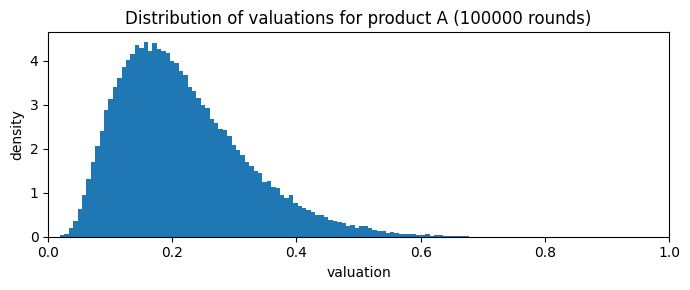

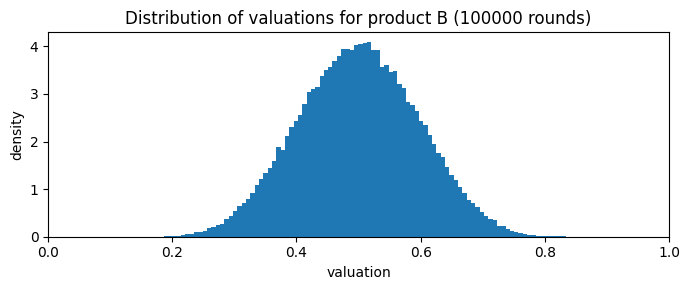

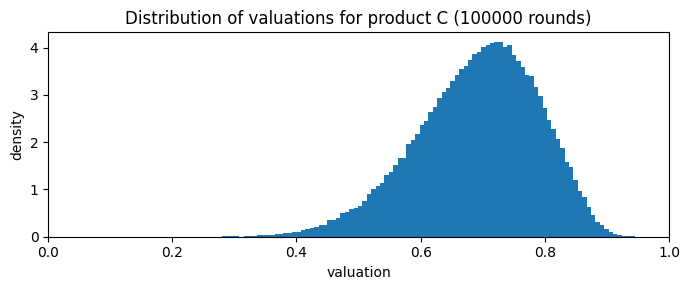

Total # of Wins: 4500
Gamma: {'A': array([0.        , 0.        , 0.        , 0.26284311, 0.73715689]), 'B': array([ 0.,  0.,  0.,  1., -0.]), 'C': array([ 0.,  0.,  0.,  1., -0.])}


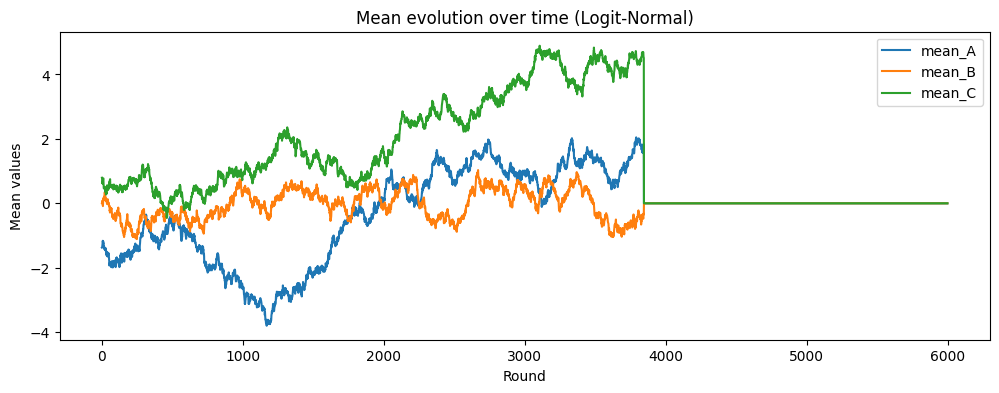

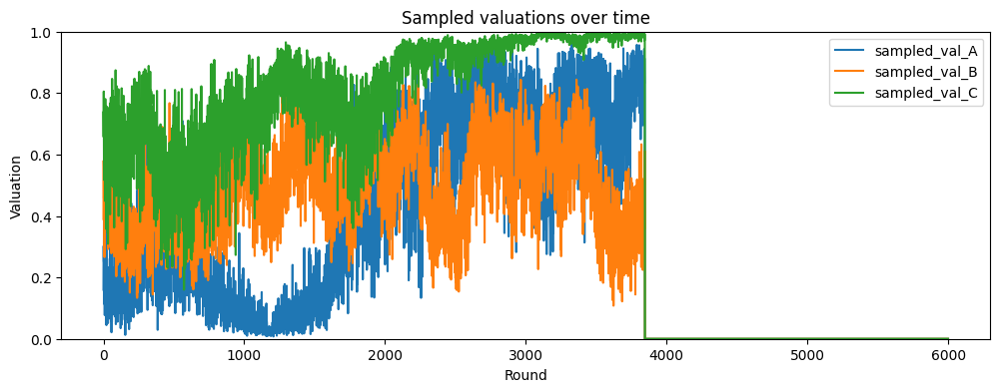

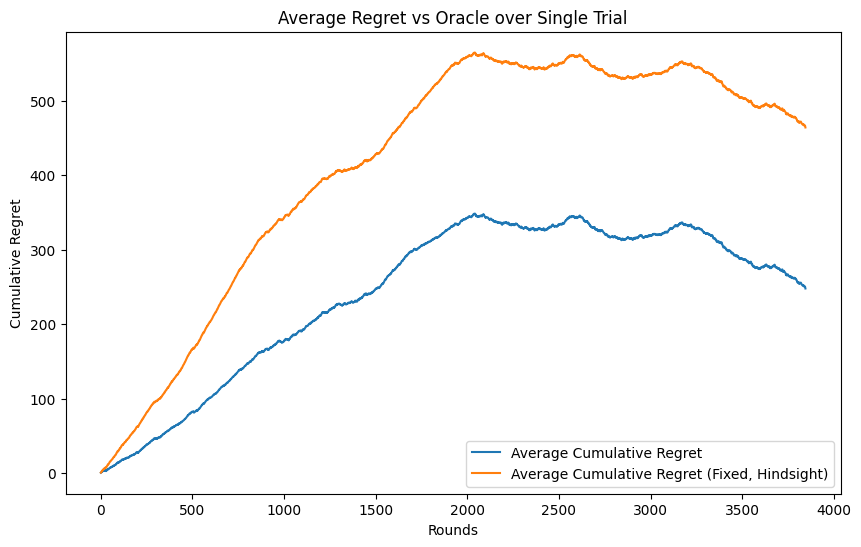

In [15]:
run_one = 1
products = ['A','B','C']
budget = 4500
T = 6000
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]
fixed_prices = 1

if fixed_prices:
  K=5
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.7)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Single Trial')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments, all_regrets_fixed_hind = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, n_jobs=-1
    )
    # Pad regrets to equal length
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

    all_regrets_fixed_hind = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_fixed_hind])
    # Computes quantiles across trials for regret analysis
    lq_regret_fixed_hind, median_regret_fixed_hind, hq_regret_fixed_hind = np.quantile(all_regrets_fixed_hind, q=[0.25, 0.5, 0.75], axis=0)

    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)


From the run, we see that:

- Prices were discretized into 5 levels between 0.01 and 1.0.
- The trial lasted for around 3000 rounds, half the available rounds, so in some rounds, multiple products where sold, given B > T/2.
-  The regret of the agent w.r.t. to both baselines is **sublinear**, it grows at the beginning, then it flattens, and it decreases, meaning the agent has learnt how to outperform both baselines.
- The (Fixed, Hindsight) baseline appears to be stronger, and this is consistent with both baselines.

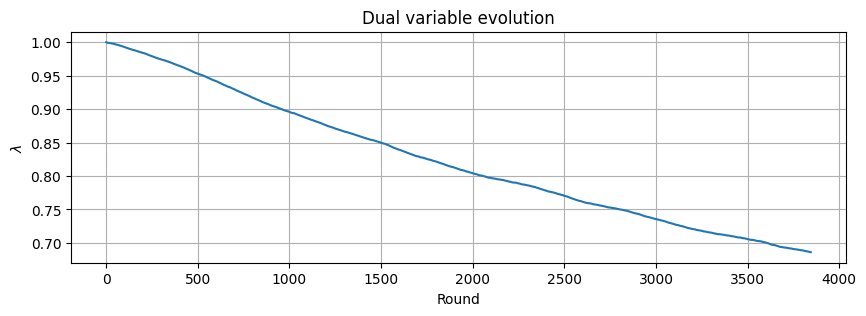

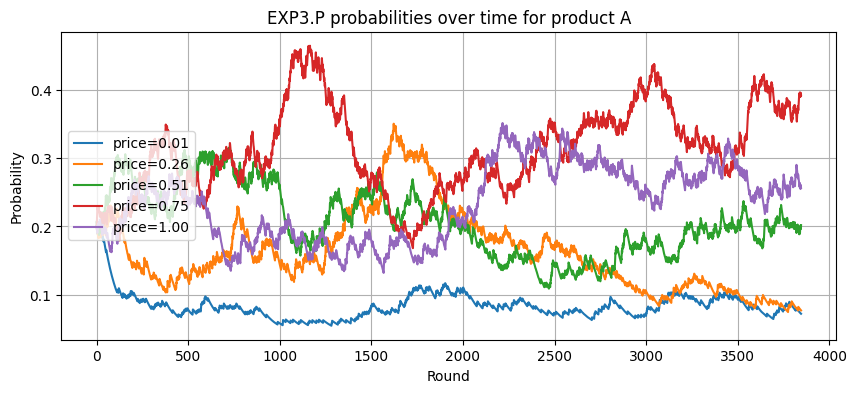

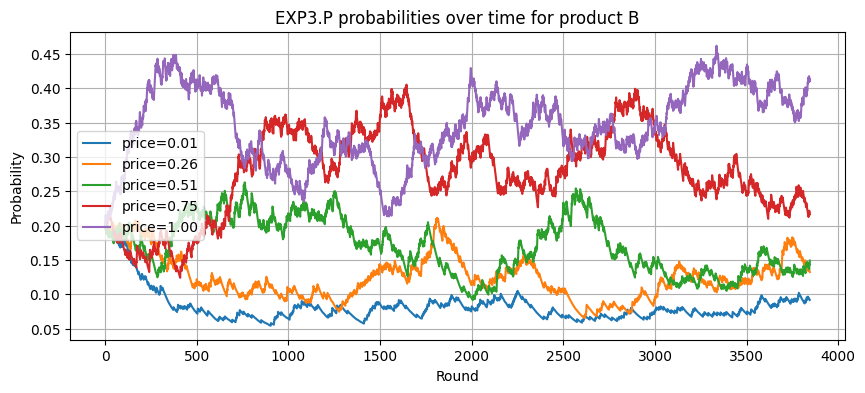

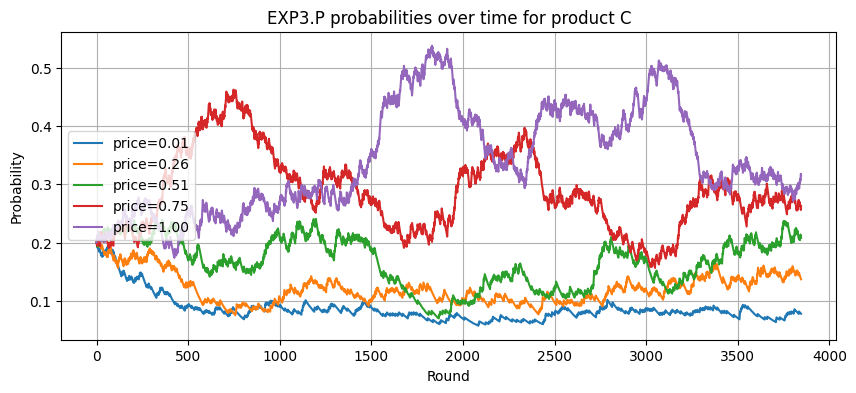

In [17]:
rounds = len(history["lambda"])
# Plot lambda evolution
plt.figure(figsize=(10,3))
plt.plot(range(rounds), history["lambda"], label=r'$\lambda$')
plt.xlabel("Round")
plt.ylabel(r"$\lambda$")
plt.title("Dual variable evolution")
plt.grid(True)
plt.show()
# Plot probabilities per product
for p in products:
    probs_arr = np.array(history["probs"][p])  # shape (rounds, K)
    Kp = probs_arr.shape[1]

    plt.figure(figsize=(10,4))
    for k in range(Kp):
        plt.plot(range(rounds), probs_arr[:, k], label=f'price={prices[p][k]:.2f}')
    plt.xlabel("Round")
    plt.ylabel("Probability")
    plt.title(f"EXP3.P probabilities over time for product {p}")
    plt.legend(loc = 'center left')
    plt.grid(True)
    plt.show()

From these plots, we can understand how the $ \lambda $ variable changes, and which are the probabilities of the prices of each product at each round, understanding how the agent evolves at each round and which are the selected prices.

#### Optimal prices

##### Multiple Trials

Now, we run the Agent for 20 Trials to ensure convergence and robust results.

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 4000
T = 6000
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0

if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.7)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments, all_regrets_fixed_hind = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, n_jobs=-1
    )
    # Pad regrets to equal length
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

    all_regrets_fixed_hind = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_fixed_hind])
    # Computes quantiles across trials for regret analysis
    lq_regret_fixed_hind, median_regret_fixed_hind, hq_regret_fixed_hind = np.quantile(all_regrets_fixed_hind, q=[0.25, 0.5, 0.75], axis=0)

    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)


Discretizing prices with 17 values
[0.01     0.071875 0.13375  0.195625 0.2575   0.319375 0.38125  0.443125
 0.505    0.566875 0.62875  0.690625 0.7525   0.814375 0.87625  0.938125
 1.      ]
{'A': array([0.01    , 0.071875, 0.13375 , 0.195625, 0.2575  , 0.319375,
       0.38125 , 0.443125, 0.505   , 0.566875, 0.62875 , 0.690625,
       0.7525  , 0.814375, 0.87625 , 0.938125, 1.      ]), 'B': array([0.01    , 0.071875, 0.13375 , 0.195625, 0.2575  , 0.319375,
       0.38125 , 0.443125, 0.505   , 0.566875, 0.62875 , 0.690625,
       0.7525  , 0.814375, 0.87625 , 0.938125, 1.      ]), 'C': array([0.01    , 0.071875, 0.13375 , 0.195625, 0.2575  , 0.319375,
       0.38125 , 0.443125, 0.505   , 0.566875, 0.62875 , 0.690625,
       0.7525  , 0.814375, 0.87625 , 0.938125, 1.      ])}




Trial 1:   0%|          | 0/6000 [00:00<?, ?it/s]


















Trial 1:   0%|          | 1/6000 [00:01<2:12:25,  1.32s/it]








Trial 1:   0%|          | 14/6000 [00:01<07:32, 13.24it/s] 











Trial 1:   0%|          | 25/6000 [00:01<03:59, 24.97it/s]












Trial 1:   1%|          | 35/6000 [00:01<02:45, 36.02it/s]












Trial 1:   1%|          | 46/6000 [00:01<02:03, 48.10it/s]

















Trial 1:   1%|          | 56/6000 [00:01<01:42, 58.05it/s]

















Trial 1:   1%|          | 67/6000 [00:01<01:26, 68.85it/s]

















Trial 1:   1%|▏         | 79/6000 [00:02<01:13, 80.84it/s]




















Trial 1:   2%|▏         | 90/6000 [00:02<01:07, 87.36it/s]


















Trial 1:   2%|▏         | 101/6000 [00:02<01:04, 91.65it/s]




















Trial 1:   2%|▏         | 112/6000 [00:02<01:05, 89.44it/s]




















Trial 1:   2%|▏         | 125/6000 [00:02<01:01, 96.18it/s]




















Trial 1:   2%|▏         |

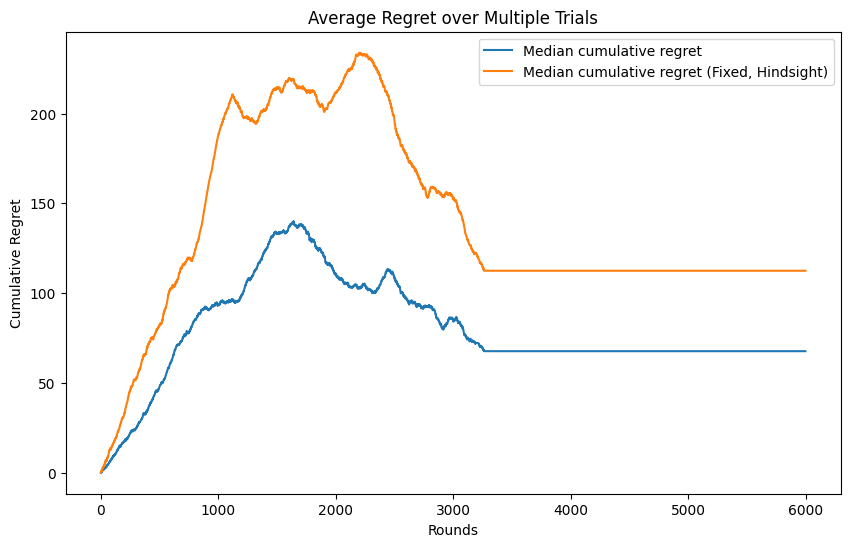

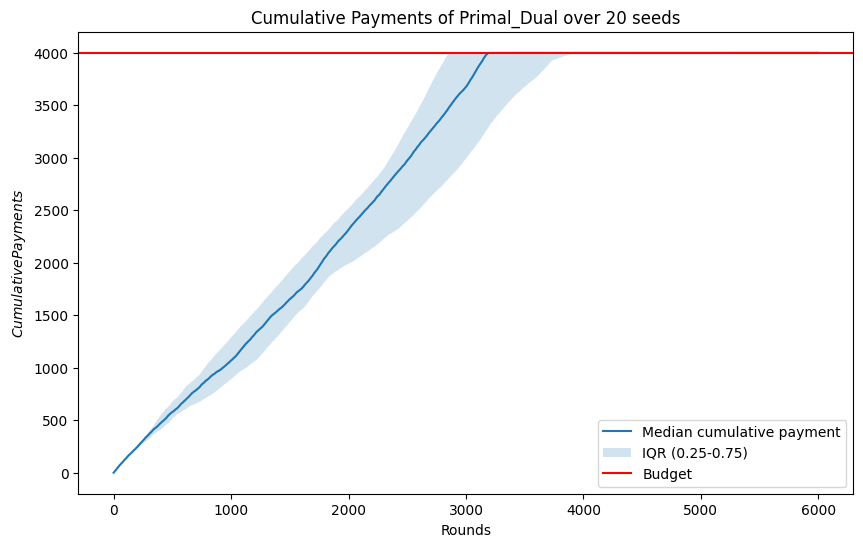

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(median_regret, label='Median cumulative regret')
#plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
plt.plot(median_regret_fixed_hind, label='Median cumulative regret (Fixed, Hindsight)')
#plt.fill_between(range(T), lq_regret_fixed_hind, hq_regret_fixed_hind, alpha=0.2, label='IQR (0.25-0.75) (Fixed, Hindsight)')
plt.xlabel('Rounds')
plt.ylabel('Cumulative Regret')
plt.title('Average Regret over Multiple Trials')
plt.legend()
plt.show()

plt.figure(figsize=(10,6))
plt.plot(median_payments, label='Median cumulative payment')
plt.fill_between(range(T), lq_payments, hq_payments, alpha=0.2, label='IQR (0.25-0.75)')
plt.xlabel('Rounds')
plt.ylabel('$Cumulative Payments$')
plt.axhline(budget, color='red', label='Budget')
plt.legend()
plt.title(f'Cumulative Payments of Primal_Dual over {len(seeds)} seeds')
plt.show()

We can see that, with multiple trials, the Agent is able to achieve **sublinear** regret on both baselines, keeping almost the same behavior it had on one trial.


#### 5 Prices (K = 5)

##### Multiple trials

In [26]:
run_one = 0
products = ['A','B','C']
budget = 4000
T = 6000
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 1

if fixed_prices:
  K=5
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.7)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments, all_regrets_fixed_hind = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, n_jobs=-1
    )
    # Pad regrets to equal length
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

    all_regrets_fixed_hind = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_fixed_hind])
    # Computes quantiles across trials for regret analysis
    lq_regret_fixed_hind, median_regret_fixed_hind, hq_regret_fixed_hind = np.quantile(all_regrets_fixed_hind, q=[0.25, 0.5, 0.75], axis=0)

    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)


Discretizing prices with 5 values
[0.01   0.2575 0.505  0.7525 1.    ]
{'A': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ]), 'B': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ]), 'C': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ])}


Trial 1:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 2:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 3:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 4:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 5:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 6:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 7:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 8:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 9:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 10:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 11:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 12:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 13:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 14:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 15:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 16:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 17:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 18:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 19:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 20:   0%|          | 0/6000 [00:00<?, ?it/s]

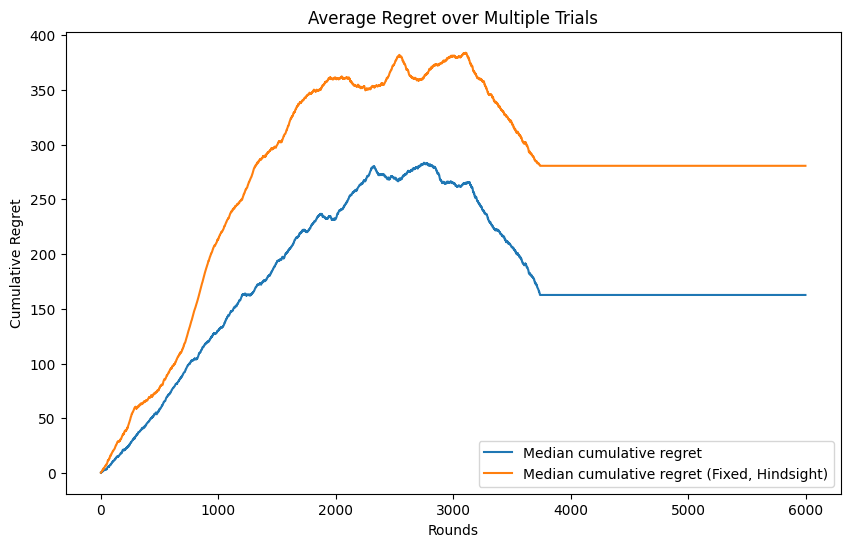

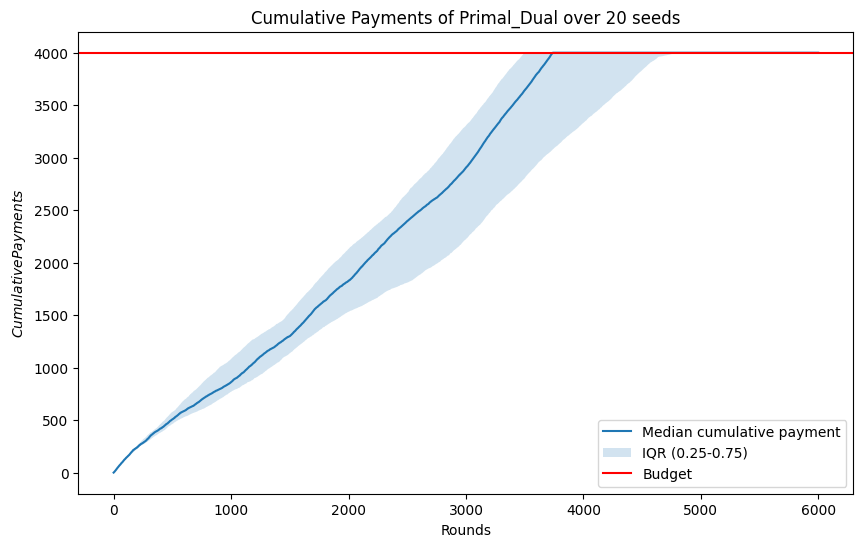

In [27]:
plt.figure(figsize=(10,6))
plt.plot(median_regret, label='Median cumulative regret')
#plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
plt.plot(median_regret_fixed_hind, label='Median cumulative regret (Fixed, Hindsight)')
#plt.fill_between(range(T), lq_regret_fixed_hind, hq_regret_fixed_hind, alpha=0.2, label='IQR (0.25-0.75) (Fixed, Hindsight)')
plt.xlabel('Rounds')
plt.ylabel('Cumulative Regret')
plt.title('Average Regret over Multiple Trials')
plt.legend()
plt.show()

plt.figure(figsize=(10,6))
plt.plot(median_payments, label='Median cumulative payment')
plt.fill_between(range(T), lq_payments, hq_payments, alpha=0.2, label='IQR (0.25-0.75)')
plt.xlabel('Rounds')
plt.ylabel('$Cumulative Payments$')
plt.axhline(budget, color='red', label='Budget')
plt.legend()
plt.title(f'Cumulative Payments of Primal_Dual over {len(seeds)} seeds')
plt.show()

We run the Agent with less prices to see how it affects the performance. We can see that the results didn't change much, the regret is still **sublinear**, similar in shape to the one obtained with the optimal number of prices.

### Trial: B = T

##### Single Trial for visualization

We run the Agent for only one trial to understand how it behaves when the budget B is equal to T.

Discretizing prices with 5 values
[0.01   0.2575 0.505  0.7525 1.    ]
{'A': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ]), 'B': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ]), 'C': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ])}


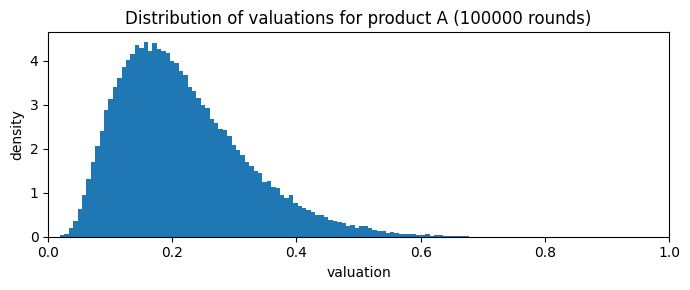

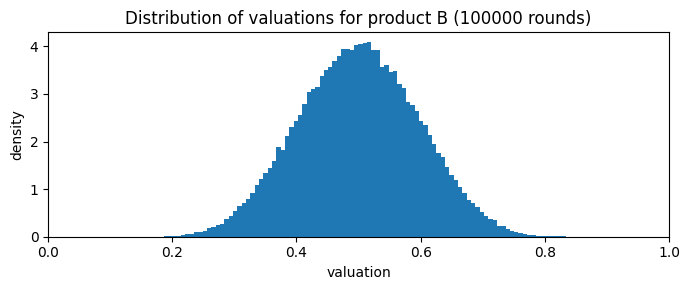

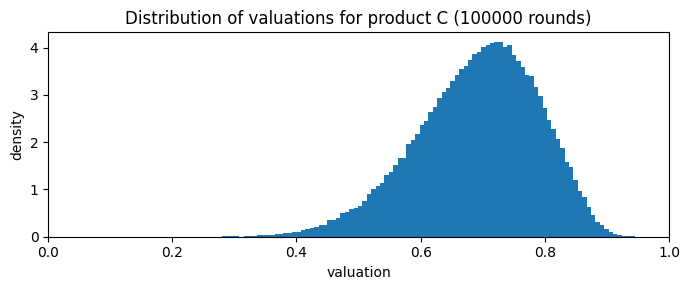

Total # of Wins: 6000
Gamma: {'A': array([0.        , 0.        , 0.        , 0.97245356, 0.02754644]), 'B': array([ 0.,  0.,  0.,  1., -0.]), 'C': array([ 0.,  0.,  0.,  1., -0.])}


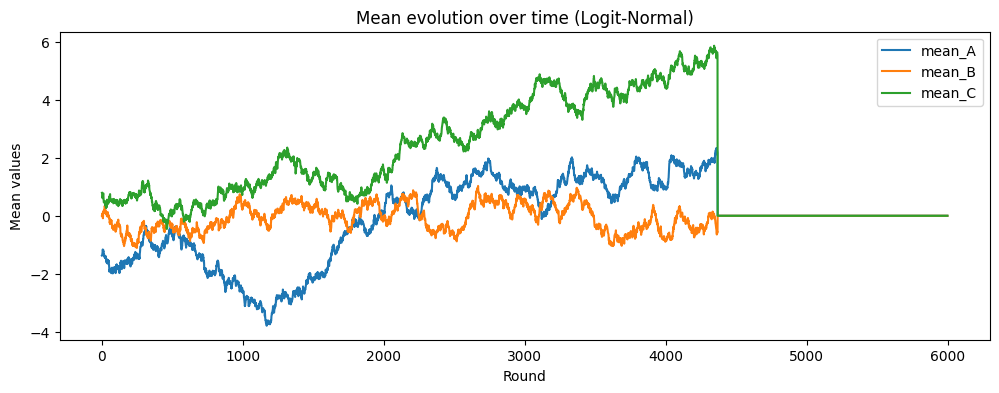

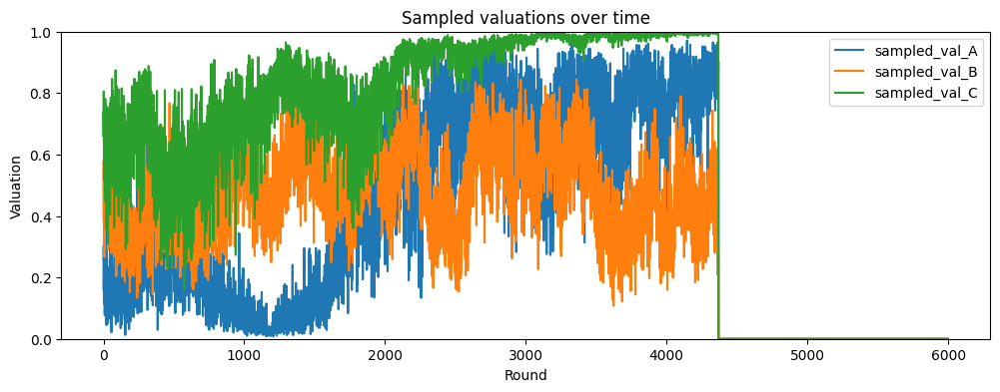

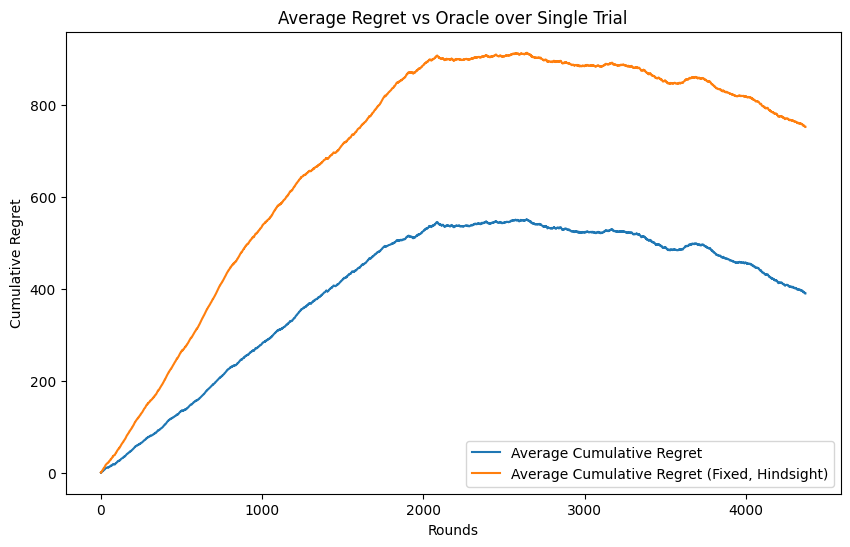

In [18]:
run_one = 1
products = ['A','B','C']
budget = 6000
T = 6000
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]
fixed_prices = 1

if fixed_prices:
  K=5
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.7)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Single Trial')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments, all_regrets_fixed_hind = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, n_jobs=-1
    )
    # Pad regrets to equal length
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

    all_regrets_fixed_hind = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_fixed_hind])
    # Computes quantiles across trials for regret analysis
    lq_regret_fixed_hind, median_regret_fixed_hind, hq_regret_fixed_hind = np.quantile(all_regrets_fixed_hind, q=[0.25, 0.5, 0.75], axis=0)

    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)


In this single trial simulation, the agent gradually learns profitable prices for all products. Early rounds show high variability, with some rounds yielding no sales when prices exceed sampled valuations. Over time, the discounted EXP3.P strategy adapts to the latent logit-normal valuations, increasing revenue for higher value products (C > B > A). From the run, we see that:
-  The regret of the agent w.r.t. to both baselines is **sublinear**, it grows at the beginning, then it flattens, and it decreases a bit for the fixed baseline.
- The (Fixed, Hindsight) baseline appears to be stronger, and this is consistent with both baselines.

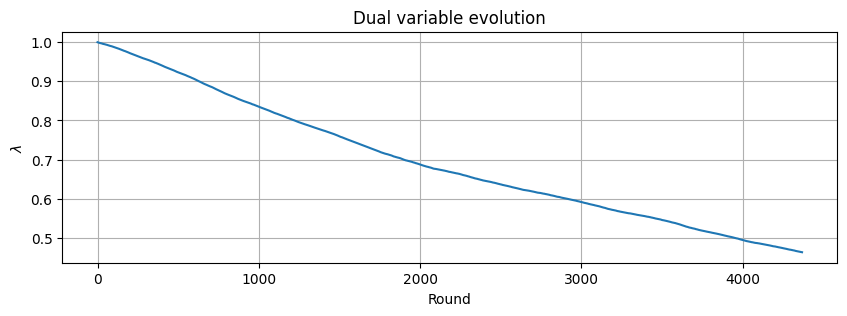

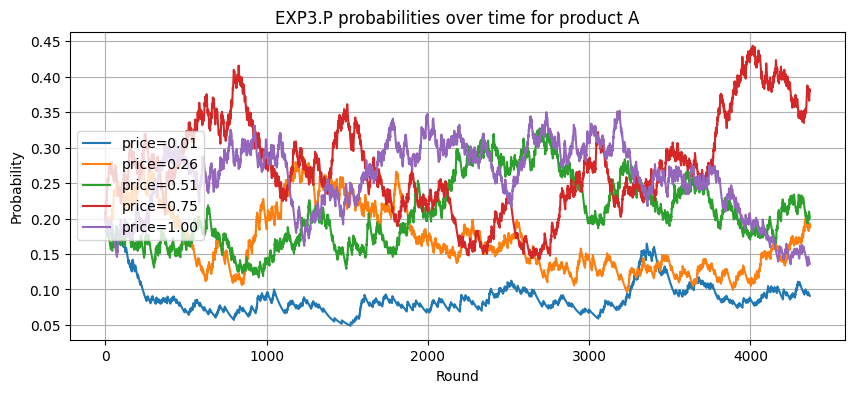

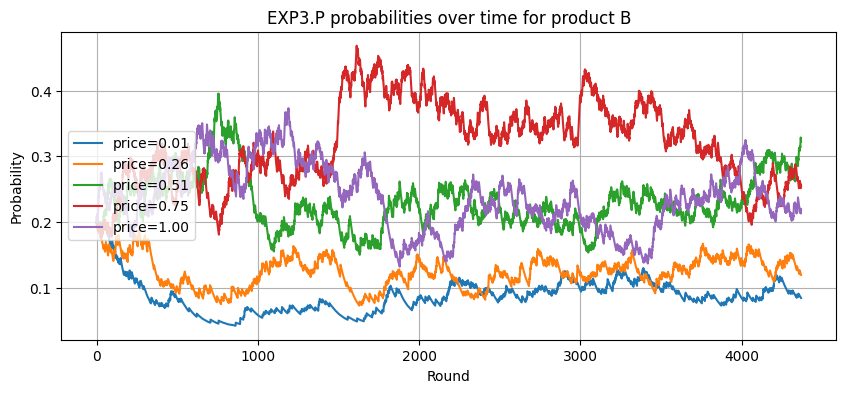

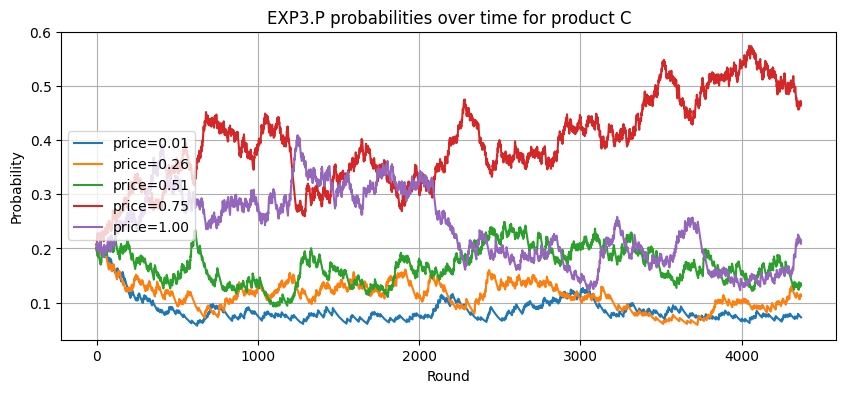

In [19]:
rounds = len(history["lambda"])
# Plot lambda evolution
plt.figure(figsize=(10,3))
plt.plot(range(rounds), history["lambda"], label=r'$\lambda$')
plt.xlabel("Round")
plt.ylabel(r"$\lambda$")
plt.title("Dual variable evolution")
plt.grid(True)
plt.show()
# Plot probabilities per product
for p in products:
    probs_arr = np.array(history["probs"][p])  # shape (rounds, K)
    Kp = probs_arr.shape[1]

    plt.figure(figsize=(10,4))
    for k in range(Kp):
        plt.plot(range(rounds), probs_arr[:, k], label=f'price={prices[p][k]:.2f}')
    plt.xlabel("Round")
    plt.ylabel("Probability")
    plt.title(f"EXP3.P probabilities over time for product {p}")
    plt.legend(loc = 'center left')
    plt.grid(True)
    plt.show()

From these plots, we can understand how the $ \lambda $ variable changes, and which are the probabilities of the prices of each product at each round, understanding how the agent evolves at each round and which are the selected prices. We notice that $ \lambda $ decreases more than in the previous case because now the Agent has more budget to spent.

#### Optimal Prices

##### Multiple Trials

Now, we run the Agent for 20 Trials to ensure convergence and robust results.

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 6000
T = 6000
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0

if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.7)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments, all_regrets_fixed_hind = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, n_jobs=-1
    )
    # Pad regrets to equal length
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

    all_regrets_fixed_hind = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_fixed_hind])
    # Computes quantiles across trials for regret analysis
    lq_regret_fixed_hind, median_regret_fixed_hind, hq_regret_fixed_hind = np.quantile(all_regrets_fixed_hind, q=[0.25, 0.5, 0.75], axis=0)

    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)


Discretizing prices with 17 values
[0.01     0.071875 0.13375  0.195625 0.2575   0.319375 0.38125  0.443125
 0.505    0.566875 0.62875  0.690625 0.7525   0.814375 0.87625  0.938125
 1.      ]
{'A': array([0.01    , 0.071875, 0.13375 , 0.195625, 0.2575  , 0.319375,
       0.38125 , 0.443125, 0.505   , 0.566875, 0.62875 , 0.690625,
       0.7525  , 0.814375, 0.87625 , 0.938125, 1.      ]), 'B': array([0.01    , 0.071875, 0.13375 , 0.195625, 0.2575  , 0.319375,
       0.38125 , 0.443125, 0.505   , 0.566875, 0.62875 , 0.690625,
       0.7525  , 0.814375, 0.87625 , 0.938125, 1.      ]), 'C': array([0.01    , 0.071875, 0.13375 , 0.195625, 0.2575  , 0.319375,
       0.38125 , 0.443125, 0.505   , 0.566875, 0.62875 , 0.690625,
       0.7525  , 0.814375, 0.87625 , 0.938125, 1.      ])}





Trial 1:   0%|          | 0/6000 [00:00<?, ?it/s]



















Trial 1:   0%|          | 1/6000 [00:01<2:11:06,  1.31s/it]

Trial 1:   0%|          | 13/6000 [00:01<08:09, 12.24it/s] 








Trial 1:   0%|          | 25/6000 [00:01<03:58, 25.01it/s]













Trial 1:   1%|          | 36/6000 [00:01<02:39, 37.28it/s]














Trial 1:   1%|          | 46/6000 [00:01<02:06, 47.04it/s]














Trial 1:   1%|          | 58/6000 [00:01<01:37, 60.98it/s]



















Trial 1:   1%|          | 69/6000 [00:01<01:23, 70.81it/s]





















Trial 1:   1%|▏         | 83/6000 [00:02<01:10, 84.40it/s]


























Trial 1:   2%|▏         | 94/6000 [00:02<01:07, 86.91it/s]
















Trial 1:   2%|▏         | 106/6000 [00:02<01:02, 94.83it/s]




















Trial 1:   2%|▏         | 117/6000 [00:02<00:59, 98.28it/s]
























Trial 1:   2%|▏         | 128/6000 [00:02<01:04, 90.71it/s]




















Trial 1:   2%|▏    

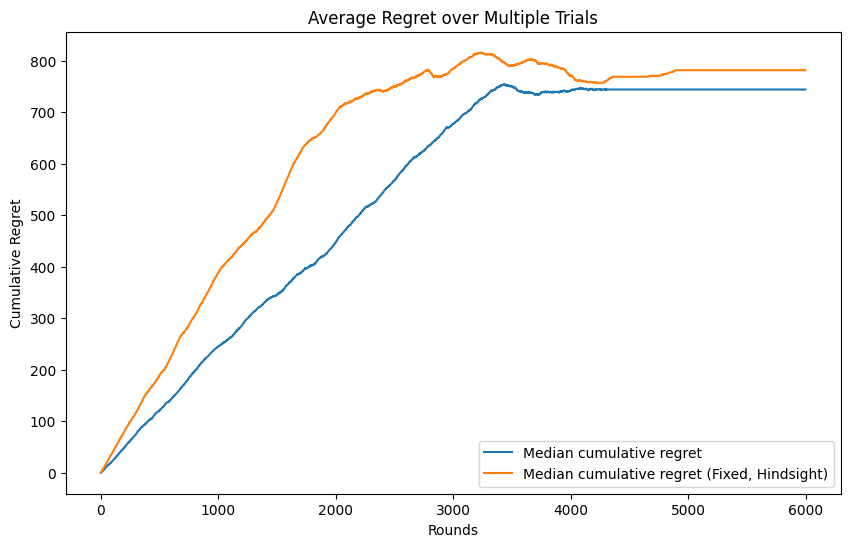

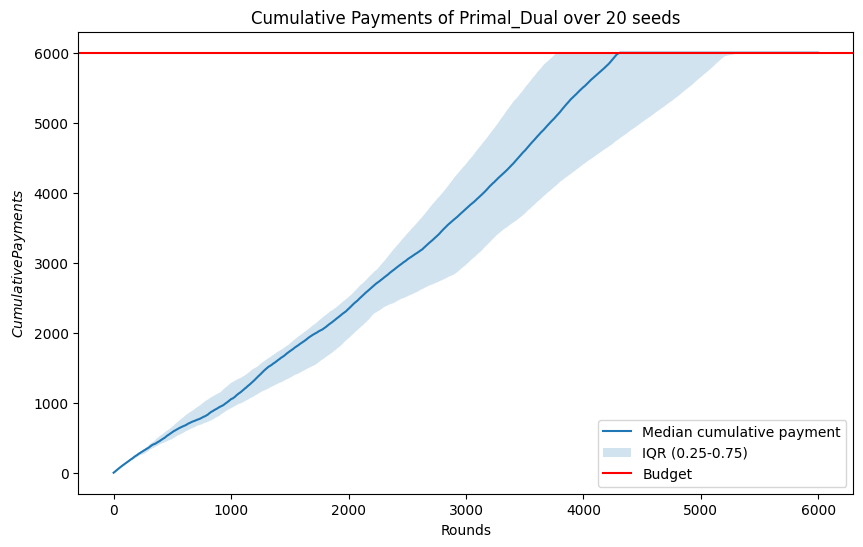

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(median_regret, label='Median cumulative regret')
#plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
plt.plot(median_regret_fixed_hind, label='Median cumulative regret (Fixed, Hindsight)')
#plt.fill_between(range(T), lq_regret_fixed_hind, hq_regret_fixed_hind, alpha=0.2, label='IQR (0.25-0.75) (Fixed, Hindsight)')
plt.xlabel('Rounds')
plt.ylabel('Cumulative Regret')
plt.title('Average Regret over Multiple Trials')
plt.legend()
plt.show()

plt.figure(figsize=(10,6))
plt.plot(median_payments, label='Median cumulative payment')
plt.fill_between(range(T), lq_payments, hq_payments, alpha=0.2, label='IQR (0.25-0.75)')
plt.xlabel('Rounds')
plt.ylabel('$Cumulative Payments$')
plt.axhline(budget, color='red', label='Budget')
plt.legend()
plt.title(f'Cumulative Payments of Primal_Dual over {len(seeds)} seeds')
plt.show()

We can see that, with multiple trials, the Agent is able to achieve **sublinear** regret on both baselines. With the blue line baseline, the regret flattens out only at the end, showing for lots of round a behavior similar to linear regret.

#### 5 Prices (K = 5)

##### Multiple trials

In [20]:
run_one = 0
products = ['A','B','C']
budget = 6000
T = 6000
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 1

if fixed_prices:
  K=5
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.7)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments, all_regrets_fixed_hind = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, n_jobs=-1
    )
    # Pad regrets to equal length
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

    all_regrets_fixed_hind = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_fixed_hind])
    # Computes quantiles across trials for regret analysis
    lq_regret_fixed_hind, median_regret_fixed_hind, hq_regret_fixed_hind = np.quantile(all_regrets_fixed_hind, q=[0.25, 0.5, 0.75], axis=0)

    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)


Discretizing prices with 5 values
[0.01   0.2575 0.505  0.7525 1.    ]
{'A': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ]), 'B': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ]), 'C': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ])}


Trial 2:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 1:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 3:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 4:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 5:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 6:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 7:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 8:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 9:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 10:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 11:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 12:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 13:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 14:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 15:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 16:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 17:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 18:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 19:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 20:   0%|          | 0/6000 [00:00<?, ?it/s]

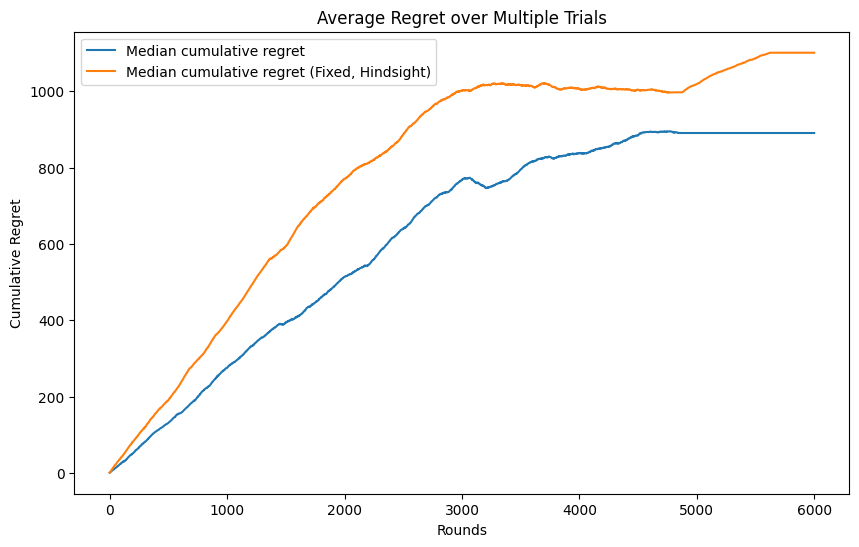

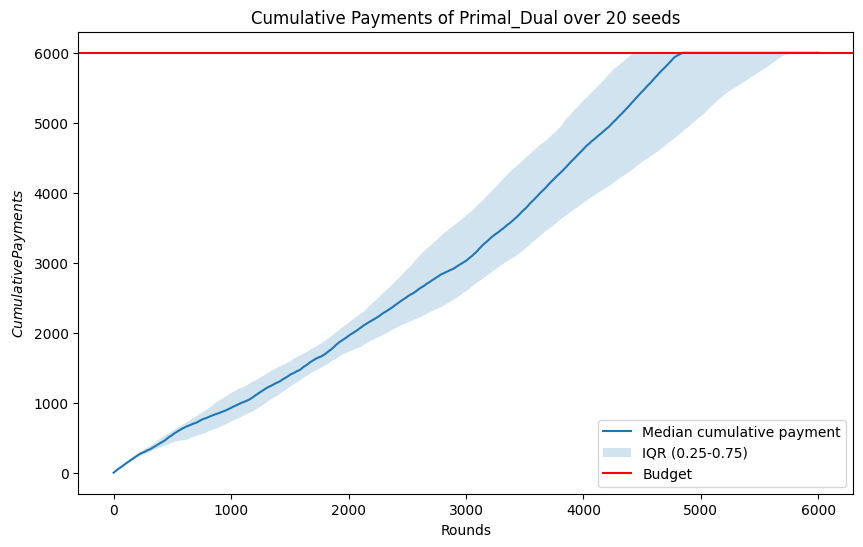

In [21]:
plt.figure(figsize=(10,6))
plt.plot(median_regret, label='Median cumulative regret')
#plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
plt.plot(median_regret_fixed_hind, label='Median cumulative regret (Fixed, Hindsight)')
#plt.fill_between(range(T), lq_regret_fixed_hind, hq_regret_fixed_hind, alpha=0.2, label='IQR (0.25-0.75) (Fixed, Hindsight)')
plt.xlabel('Rounds')
plt.ylabel('Cumulative Regret')
plt.title('Average Regret over Multiple Trials')
plt.legend()
plt.show()

plt.figure(figsize=(10,6))
plt.plot(median_payments, label='Median cumulative payment')
plt.fill_between(range(T), lq_payments, hq_payments, alpha=0.2, label='IQR (0.25-0.75)')
plt.xlabel('Rounds')
plt.ylabel('$Cumulative Payments$')
plt.axhline(budget, color='red', label='Budget')
plt.legend()
plt.title(f'Cumulative Payments of Primal_Dual over {len(seeds)} seeds')
plt.show()

We run the Agent with less prices to see how it affects the performance. We can see that the results didn't change much, the regret is still **sublinear**, similar in shape to the one obtained with the optimal number of prices. For the blue line baseline, we notice that the behavior is less "linear", while the fixed baseline starts to flatten out a little earlier.

### Trial: B > T

#### Optimal prices

##### Single Trial for visualization

We run the Agent for only one trial to understand how it behaves when the budget B is greater than T.

Discretizing prices with 5 values
[0.01   0.2575 0.505  0.7525 1.    ]
{'A': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ]), 'B': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ]), 'C': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ])}


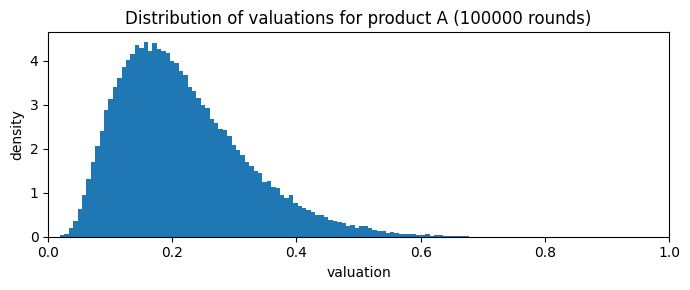

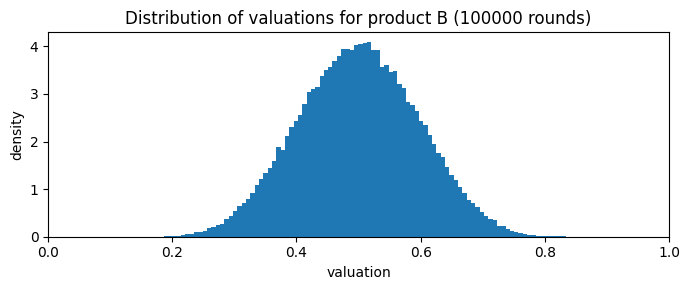

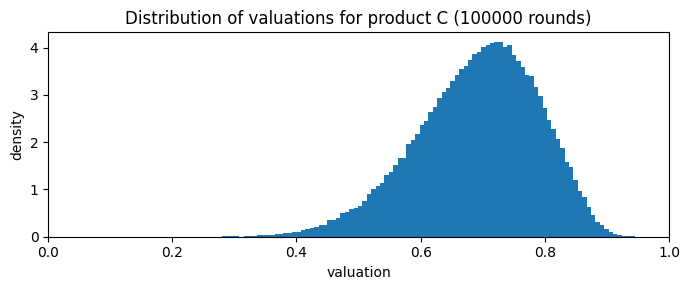

Total # of Wins: 8000
Gamma: {'A': array([ 0.,  0., -0.,  1.,  0.]), 'B': array([0.       , 0.       , 0.6051719, 0.3948281, 0.       ]), 'C': array([ 0.,  0., -0.,  1.,  0.])}


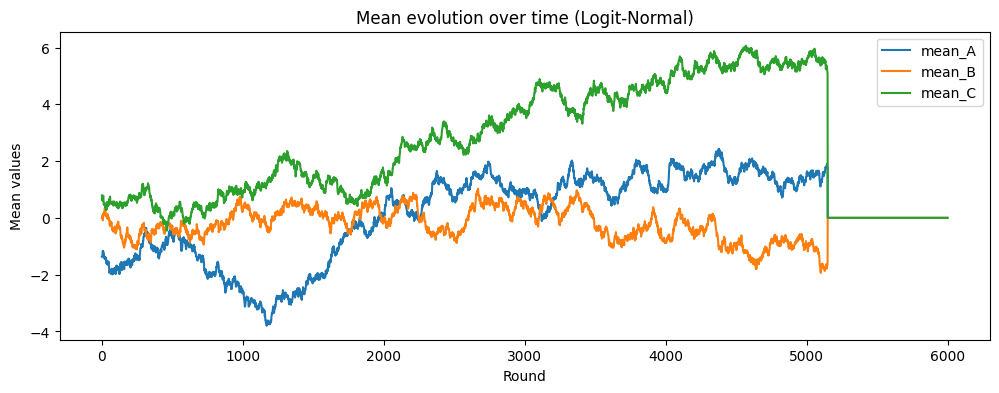

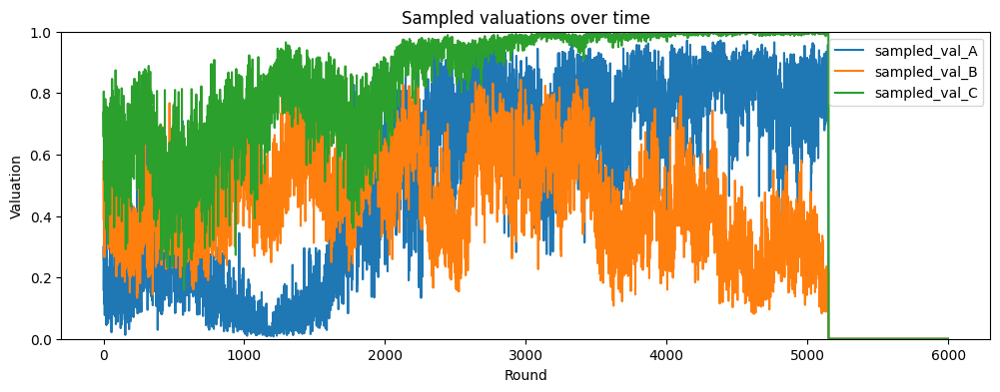

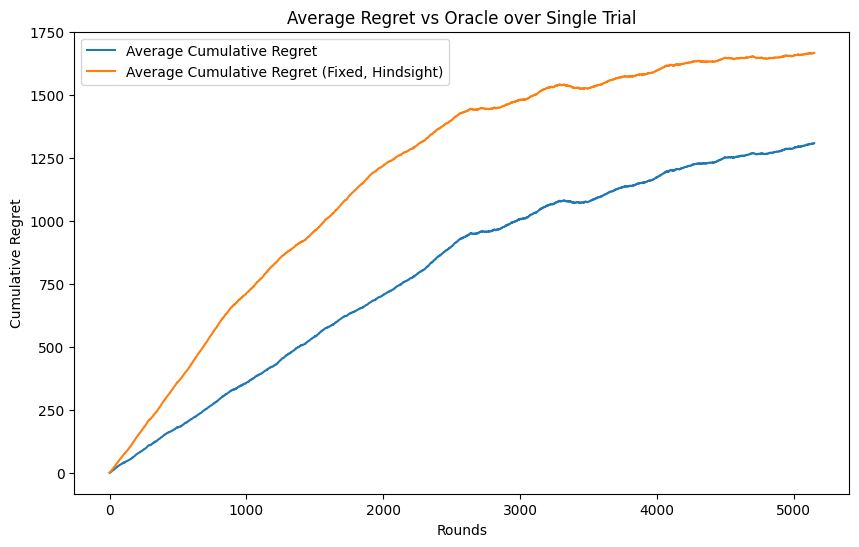

In [22]:
run_one = 1
products = ['A','B','C']
budget = 8000
T = 6000
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]
fixed_prices = 1

if fixed_prices:
  K=5
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.7)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Single Trial')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments, all_regrets_fixed_hind = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, n_jobs=-1
    )
    # Pad regrets to equal length
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

    all_regrets_fixed_hind = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_fixed_hind])
    # Computes quantiles across trials for regret analysis
    lq_regret_fixed_hind, median_regret_fixed_hind, hq_regret_fixed_hind = np.quantile(all_regrets_fixed_hind, q=[0.25, 0.5, 0.75], axis=0)

    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)


We can notice that we have two different behaviors w.r.t. the two different baselines. The regret represneted by the orange line (fixed, hindshight) is clearly **sublinear** because it clearly flattens out around 2000 rounds, while the regret given by the blue line (baseline computed at each round) is still **sublinear** but not clearly, suggesting that the agent struggles to match the performance requested by this baseline. Overall, we can underline that the agent now starts to struggle, because it struggles with the $ \lambda $ update when $ \rho $ is above 1.

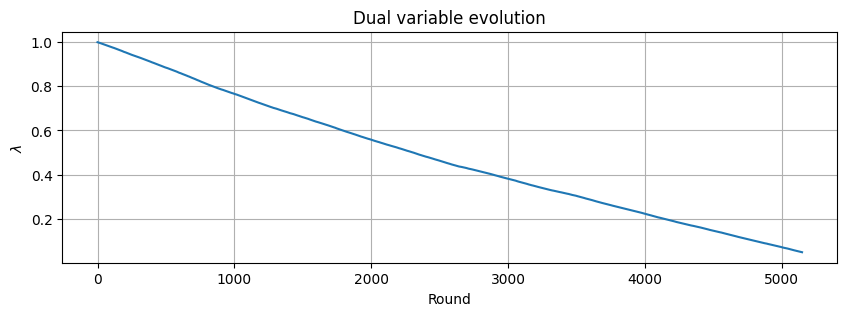

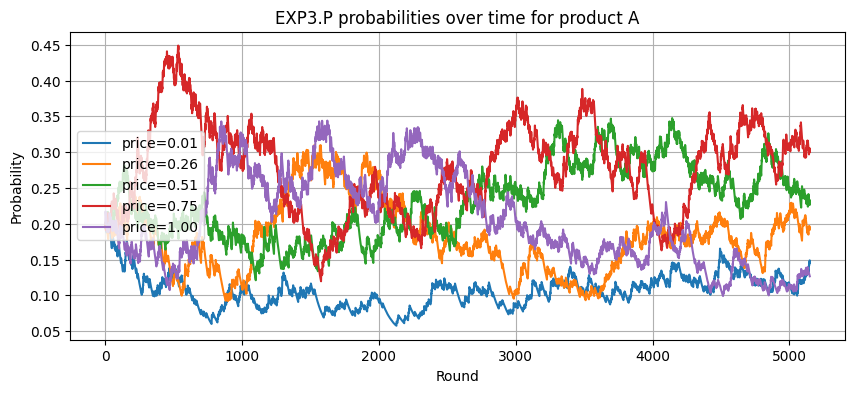

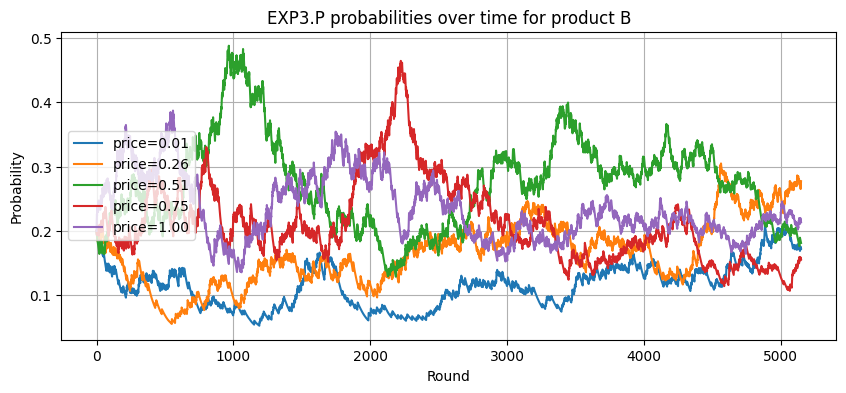

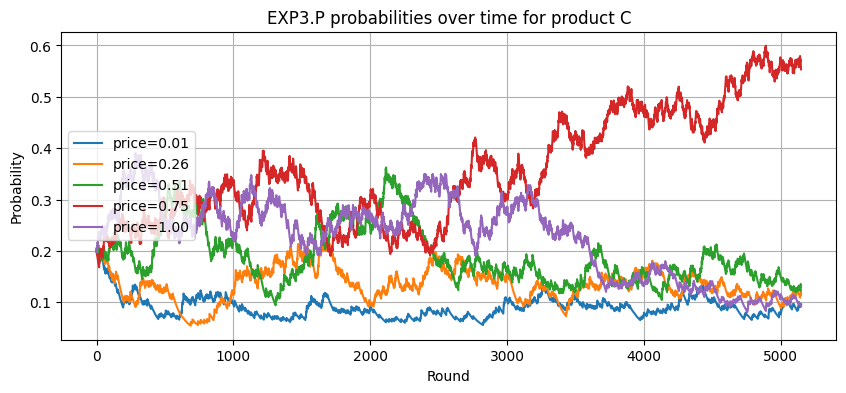

In [23]:
rounds = len(history["lambda"])
# Plot lambda evolution
plt.figure(figsize=(10,3))
plt.plot(range(rounds), history["lambda"], label=r'$\lambda$')
plt.xlabel("Round")
plt.ylabel(r"$\lambda$")
plt.title("Dual variable evolution")
plt.grid(True)
plt.show()
# Plot probabilities per product
for p in products:
    probs_arr = np.array(history["probs"][p])  # shape (rounds, K)
    Kp = probs_arr.shape[1]

    plt.figure(figsize=(10,4))
    for k in range(Kp):
        plt.plot(range(rounds), probs_arr[:, k], label=f'price={prices[p][k]:.2f}')
    plt.xlabel("Round")
    plt.ylabel("Probability")
    plt.title(f"EXP3.P probabilities over time for product {p}")
    plt.legend(loc = 'center left')
    plt.grid(True)
    plt.show()

We notice that $ \lambda $ decreases over the rounds and approaches 0 (0.2), while the probabilities of the prices are difficult to distinguish for the first two products, while for the third, at the end, there is clearly a price that is more selected than the others, because this is the product that potentially yields the maximum profit so the agent learns how to correctly assign the best price to it.

##### Multiple Trials

Now, we run the Agent for 20 Trials to ensure convergence and robust results.

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 8000
T = 6000
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0

if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.7)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments, all_regrets_fixed_hind = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, n_jobs=-1
    )
    # Pad regrets to equal length
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

    all_regrets_fixed_hind = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_fixed_hind])
    # Computes quantiles across trials for regret analysis
    lq_regret_fixed_hind, median_regret_fixed_hind, hq_regret_fixed_hind = np.quantile(all_regrets_fixed_hind, q=[0.25, 0.5, 0.75], axis=0)

    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)


Discretizing prices with 17 values
[0.01     0.071875 0.13375  0.195625 0.2575   0.319375 0.38125  0.443125
 0.505    0.566875 0.62875  0.690625 0.7525   0.814375 0.87625  0.938125
 1.      ]
{'A': array([0.01    , 0.071875, 0.13375 , 0.195625, 0.2575  , 0.319375,
       0.38125 , 0.443125, 0.505   , 0.566875, 0.62875 , 0.690625,
       0.7525  , 0.814375, 0.87625 , 0.938125, 1.      ]), 'B': array([0.01    , 0.071875, 0.13375 , 0.195625, 0.2575  , 0.319375,
       0.38125 , 0.443125, 0.505   , 0.566875, 0.62875 , 0.690625,
       0.7525  , 0.814375, 0.87625 , 0.938125, 1.      ]), 'C': array([0.01    , 0.071875, 0.13375 , 0.195625, 0.2575  , 0.319375,
       0.38125 , 0.443125, 0.505   , 0.566875, 0.62875 , 0.690625,
       0.7525  , 0.814375, 0.87625 , 0.938125, 1.      ])}























Trial 1:   0%|          | 0/6000 [00:00<?, ?it/s]


















Trial 1:   0%|          | 1/6000 [00:01<2:55:01,  1.75s/it]
















Trial 1:   0%|          | 14/6000 [00:01<09:41, 10.30it/s] 




















Trial 1:   0%|          | 24/6000 [00:01<05:15, 18.91it/s]




















Trial 1:   1%|          | 37/6000 [00:02<03:05, 32.18it/s]
























Trial 1:   1%|          | 48/6000 [00:02<02:31, 39.27it/s]




















Trial 1:   1%|          | 65/6000 [00:02<01:39, 59.90it/s]




















Trial 1:   1%|▏         | 78/6000 [00:02<01:22, 71.56it/s]




















Trial 1:   2%|▏         | 91/6000 [00:02<01:11, 82.76it/s]


























Trial 1:   2%|▏         | 103/6000 [00:02<01:09, 84.69it/s]




















Trial 1:   2%|▏         | 116/6000 [00:02<01:03, 92.87it/s]























Trial 1:   2%|▏         | 131/6000 [00:02<00:56, 103.85it/s]















Trial 1:   2%|▏         | 144/60

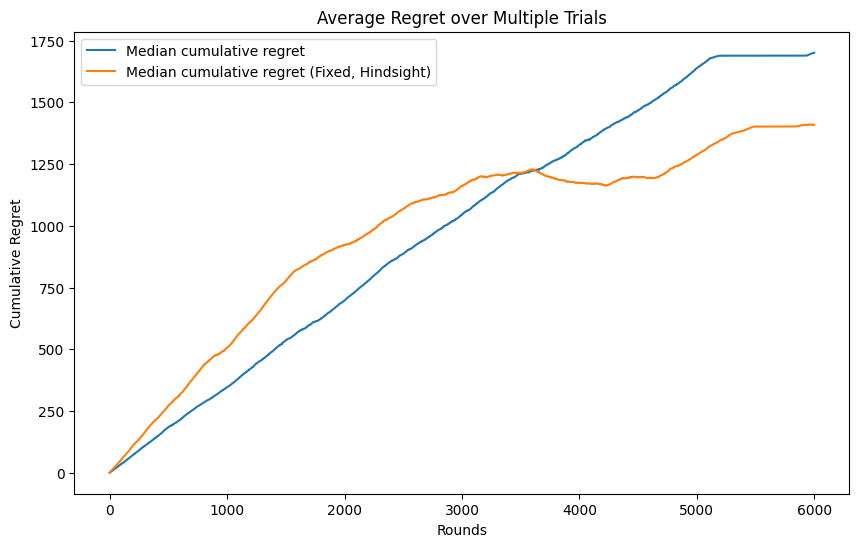

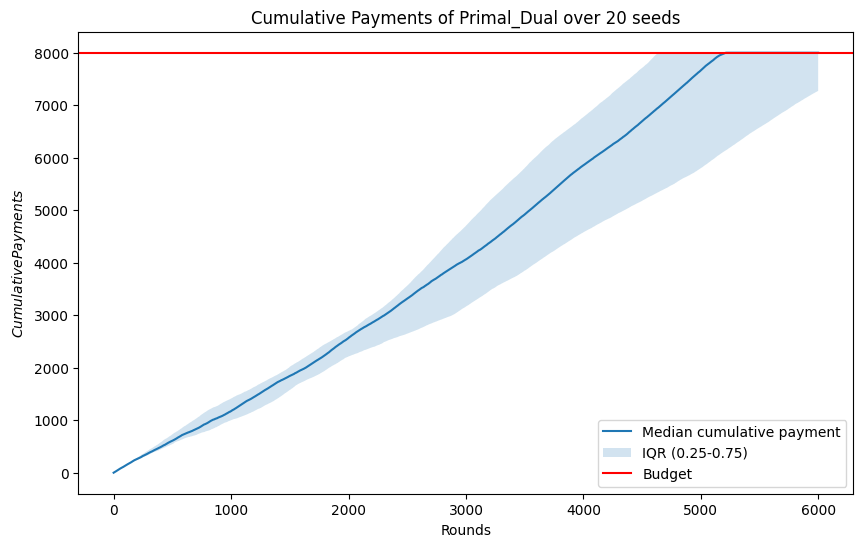

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(median_regret, label='Median cumulative regret')
#plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
plt.plot(median_regret_fixed_hind, label='Median cumulative regret (Fixed, Hindsight)')
#plt.fill_between(range(T), lq_regret_fixed_hind, hq_regret_fixed_hind, alpha=0.2, label='IQR (0.25-0.75) (Fixed, Hindsight)')
plt.xlabel('Rounds')
plt.ylabel('Cumulative Regret')
plt.title('Average Regret over Multiple Trials')
plt.legend()
plt.show()

plt.figure(figsize=(10,6))
plt.plot(median_payments, label='Median cumulative payment')
plt.fill_between(range(T), lq_payments, hq_payments, alpha=0.2, label='IQR (0.25-0.75)')
plt.xlabel('Rounds')
plt.ylabel('$Cumulative Payments$')
plt.axhline(budget, color='red', label='Budget')
plt.legend()
plt.title(f'Cumulative Payments of Primal_Dual over {len(seeds)} seeds')
plt.show()

We notice that the regret w.r.t. to the fixed, hindsight baseline is **sublinear**, while it is **linear** w.r.t. to the baseline computed at each round, meaning that the Agent is not able to outperform it.

#### 5 Prices (K = 5)

##### Multiple trials

In [24]:
run_one = 0
products = ['A','B','C']
budget = 8000
T = 6000
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 1

if fixed_prices:
  K=5
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.7)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments, all_regrets_fixed_hind = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, n_jobs=-1
    )
    # Pad regrets to equal length
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

    all_regrets_fixed_hind = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_fixed_hind])
    # Computes quantiles across trials for regret analysis
    lq_regret_fixed_hind, median_regret_fixed_hind, hq_regret_fixed_hind = np.quantile(all_regrets_fixed_hind, q=[0.25, 0.5, 0.75], axis=0)

    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)


Discretizing prices with 5 values
[0.01   0.2575 0.505  0.7525 1.    ]
{'A': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ]), 'B': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ]), 'C': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ])}


Trial 1:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 2:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 3:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 4:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 5:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 6:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 7:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 8:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 9:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 10:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 11:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 12:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 13:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 14:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 15:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 16:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 17:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 18:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 19:   0%|          | 0/6000 [00:00<?, ?it/s]

Trial 20:   0%|          | 0/6000 [00:00<?, ?it/s]

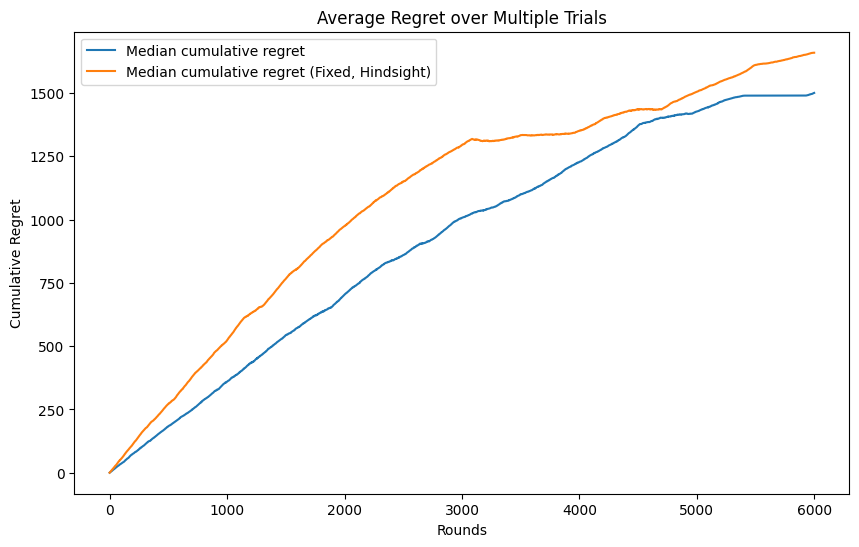

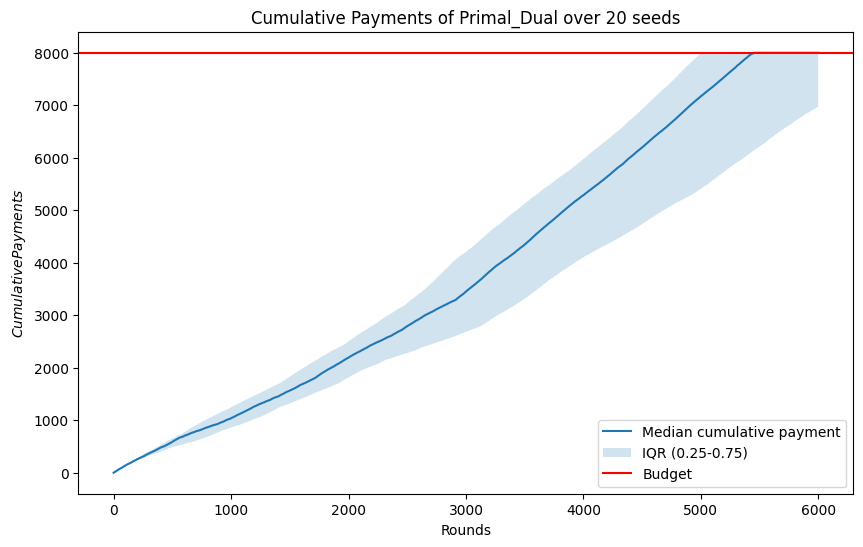

In [25]:
plt.figure(figsize=(10,6))
plt.plot(median_regret, label='Median cumulative regret')
#plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
plt.plot(median_regret_fixed_hind, label='Median cumulative regret (Fixed, Hindsight)')
#plt.fill_between(range(T), lq_regret_fixed_hind, hq_regret_fixed_hind, alpha=0.2, label='IQR (0.25-0.75) (Fixed, Hindsight)')
plt.xlabel('Rounds')
plt.ylabel('Cumulative Regret')
plt.title('Average Regret over Multiple Trials')
plt.legend()
plt.show()

plt.figure(figsize=(10,6))
plt.plot(median_payments, label='Median cumulative payment')
plt.fill_between(range(T), lq_payments, hq_payments, alpha=0.2, label='IQR (0.25-0.75)')
plt.xlabel('Rounds')
plt.ylabel('$Cumulative Payments$')
plt.axhline(budget, color='red', label='Budget')
plt.legend()
plt.title(f'Cumulative Payments of Primal_Dual over {len(seeds)} seeds')
plt.show()

By reducing the number of prices to 5, we see that the regret w.r.t. the fixed, hindsight baseline remains **sublinear** as before, while now the regret w.r.t. the other baseline seems **sublinear** as well.